### Imports


In [13]:
%matplotlib inline

import numpy as np
from tqdm import tqdm
import pickle
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import torch
from pathlib import Path
import config as cfg
import argparse
from evaluation.metrics import _reform_data_from_dict
from evaluation.post_process import _calculate_fft_hr, _calculate_SNR, _compute_macc
from yacs.config import CfgNode
import ast
from typing import Union, Sequence
from evaluation.BlandAltmanPy import BlandAltman
import scipy

### Functions

In [33]:
def load_config_from_result(result_dir)->CfgNode:
    """
    Load the config from the experiment
    Args:
        result_dir (str): Path to the result directory
    Returns:
        config (CfgNode): Configuration file
    """
    result_dir = Path(result_dir)
    config_file = result_dir.glob("*/*.yaml").__next__()
    args = argparse.Namespace()
    args.config_file = config_file.as_posix()
    config = cfg.get_config(args)
    return config

def load_data_from_result(result_dir)->tuple[dict, dict]:
    """
    Load the data from the experiment
    Args:
        result_dir (str): Path to the result directory
    Returns:
        predictions (dict): Predictions dictionary
        labels (dict): Labels dictionary
    """
    result_dir = Path(result_dir)
    # load the data
    output_file = result_dir.glob("*/*.pickle").__next__()
    with open(output_file, "rb") as f:
        data = pickle.load(f)
    predictions = data['predictions']
    labels = data['labels']
    return predictions, labels

def load_dataframes(predictions,labels,traces:list, fs:int=30,reform=False)->dict:
    """
    Load the data from the experiment and return as dataframes
    Args:
        result_dir (str): Path to the result directory
    Returns:
        dfs (dict): Dictionary of dataframes for each trace type
    """

    dicts = []
    key = sorted(predictions.keys())[0]
    for key in sorted(predictions.keys()):
        video = key.split('.')[0]
        participant = video.split('_')[0]
        session = "_".join(video.split('_')[0:2])
        recording = "_".join(video.split('_')[0:3])
        posture = video.split('_')[3]
        depth = video.split('_')[4]
        camera = video.split('_')[5]
        if reform:
            prediction_dict = {0: _reform_data_from_dict(predictions[key])}
            label_dict = {0: _reform_data_from_dict(labels[key])}
        else:
            prediction_dict = predictions[key]
            label_dict = labels[key]
        for section in prediction_dict.keys():
            prediction = prediction_dict[section]
            label = label_dict[section]
            assert isinstance(prediction, torch.Tensor)
            assert isinstance(label, torch.Tensor)
            if len(prediction.shape) == 1:
                prediction = torch.unsqueeze(prediction, 0).cpu().numpy()
                label = torch.unsqueeze(label, 0).cpu().numpy()
            elif len(prediction.shape) == 2:
                prediction = prediction.cpu().numpy()
                label = label.cpu().numpy()
            else:
                raise ValueError(f"Unexpected prediction shape {prediction.shape}")
            d = {}
            for i, trace in enumerate(traces):
                pred_max_ids, pred_max_vals = find_peaks(prediction[i,:], type='max', width=int(fs*2/3))
                pred_min_ids, pred_min_vals = find_peaks(prediction[i,:], type='min', width=int(fs*2/3))
                label_max_ids, label_max_vals = find_peaks(label[i,:], type='max', width=int(fs*2/3))
                label_min_ids, label_min_vals = find_peaks(label[i,:], type='min', width=int(fs*2/3))
                
                d[trace] = {'video': video,
                            'section': section,
                            'participant': participant,
                            'session': session,
                            'recording': recording,
                            'camera': camera,
                            'posture': posture,
                            'depth': depth,
                            'prediction': prediction[i,:],
                            'pred_mean': float(np.mean(prediction[i,:])),
                            'pred_max_ids': pred_max_ids,
                            'pred_max_vals': pred_max_vals,
                            'pred_min_ids': pred_min_ids,
                            'pred_min_vals': pred_min_vals,
                            'label': label[i,:],
                            'label_mean': float(np.mean(label[i,:])),
                            'label_max_ids': label_max_ids,
                            'label_max_vals': label_max_vals,
                            'label_min_ids': label_min_ids,
                            'label_min_vals': label_min_vals
                            }
            dicts.append(d)
    dfs = {trace: pd.DataFrame(d[trace] for d in dicts) for trace in traces}
    return dfs

def find_peaks(trace: np.ndarray|torch.Tensor, type='max', width=31, print_warning=False,clip_ends=False) -> tuple:
    "Uses pytorch to find peaks within window of nominal width"
    if isinstance(trace, np.ndarray):
        trace = torch.tensor(trace)
    if type == 'max':
        window_extrema = torch.nn.functional.max_pool1d_with_indices(trace.view(1,1,-1), torch.Size([width]), 1, padding=torch.Size([width//2]))[1].squeeze()
    elif type == 'min':
        window_extrema = torch.nn.functional.max_pool1d_with_indices(-1*trace.view(1,1,-1), torch.Size([width]), 1, padding=torch.Size([width//2]))[1].squeeze()
    else:
        raise TypeError("type can only be 'max' or 'min'")
    if width%2 != 1:
        width += 1  # ensure width is odd
        if print_warning:
            print(f"Warning: width must be odd, incremented to {width}")
    candidates = window_extrema.unique()
    cleaned_idx = candidates[(window_extrema[candidates]==candidates).nonzero()].numpy().squeeze()
    cleaned_values = trace[cleaned_idx].numpy().squeeze()
    
    # clip the first and last peak if they're very different from the mean peak value
    if clip_ends:
        if len(cleaned_values) > 3:
            mean_peak_value = np.mean(cleaned_values[1:-1])
            mean_peak_std = np.std(cleaned_values[1:-1])
            if abs(cleaned_values[0] - mean_peak_value) > 2 * mean_peak_std:
                cleaned_idx = cleaned_idx[1:]
                cleaned_values = cleaned_values[1:]
            if abs(cleaned_values[-1] - mean_peak_value) > 2 * mean_peak_std:
                cleaned_idx = cleaned_idx[:-1]
                cleaned_values = cleaned_values[:-1]
    return cleaned_idx, cleaned_values

def unnormalise_trace(normed_trace:np.ndarray|torch.Tensor, trace_type:str, config_data) -> np.ndarray:
    if trace_type == 'CVP':
        trace_min, trace_max = config_data.PREPROCESS.NECKFLIX.CVP_NORM
    elif trace_type == 'ABP':
        trace_min, trace_max = config_data.PREPROCESS.NECKFLIX.ABP_NORM
    elif trace_type == 'ECG':
        trace_min, trace_max = config_data.PREPROCESS.NECKFLIX.ECG_NORM
    else:
        raise ValueError(f"Unsupported trace type {trace_type} for unnormalization")
    raw_trace = (normed_trace + 1) / 2 * (trace_max - trace_min) + trace_min
    return raw_trace

def get_hr_fft(pred: np.ndarray | torch.Tensor, 
               label: np.ndarray | torch.Tensor,
               fs: int = 30,
               window_sec: float = 10.0,
               overlap: float = 0.5,
               low_pass: float = 0.6,
               high_pass: float = 3.3) -> dict:
    """
    Calculate FFT-based heart rate with windowed estimation.
    Args: pred, label (arrays), fs (Hz), window_sec (window duration), 
          overlap (fraction), low_pass/high_pass (Hz filter bounds)
    Returns: dict with pred_hr, label_hr, hr_bias, and their SEs
    """
    if isinstance(pred, torch.Tensor):
        pred = pred.detach().cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.detach().cpu().numpy()
    
    window_samples = int(window_sec * fs)
    step = int(window_samples * (1 - overlap))
    pred_hrs, label_hrs = [], []
    
    for start in range(0, len(pred) - window_samples + 1, step):
        end = start + window_samples
        pred_hrs.append(_calculate_fft_hr(pred[start:end], fs, low_pass, high_pass))
        label_hrs.append(_calculate_fft_hr(label[start:end], fs, low_pass, high_pass))
    
    pred_hrs, label_hrs = np.array(pred_hrs), np.array(label_hrs)
    mp, stdp, sep = mean_se(pred_hrs, method='naive')
    ml, stdl, sel = mean_se(label_hrs, method='naive')
    bias_std = np.sqrt(stdp**2 + stdl**2)
    bias_se = np.sqrt(sep**2 + sel**2)
    
    return {
        "pred_hr": mp, "pred_hr_std": stdp, "pred_hr_se": sep,
        "label_hr": ml, "label_hr_std": stdl, "label_hr_se": sel,
        "hr_bias": mp - ml, "hr_bias_std": bias_std, "hr_bias_se": float(bias_se)
    }

def get_snr(pred: np.ndarray | torch.Tensor,
            label: np.ndarray | torch.Tensor,
            fs: int = 30,
            window_sec: float = 10.0,
            overlap: float = 0.5,
            low_pass: float = 0.6,
            high_pass: float = 3.3) -> dict:
    """
    Calculate SNR (signal-to-noise ratio) with windowed estimation.
    Args: pred, label (arrays), fs (Hz), window_sec (window duration),
          overlap (fraction), low_pass/high_pass (Hz filter bounds)
    Returns: dict with snr, snr_std, snr_se
    """
    if isinstance(pred, torch.Tensor):
        pred = pred.detach().cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.detach().cpu().numpy()
    
    # Perform a check to see if the length of the signals is less than the window size, if so,
    # calculate SNR on the entire signal without windowing and return NaNs for std and se
    if len(pred) < int(window_sec * fs):
        hr_label = _calculate_fft_hr(label, fs, low_pass, high_pass)
        snr = _calculate_SNR(pred, hr_label, fs, low_pass, high_pass)
        hr_pred = _calculate_fft_hr(pred, fs, low_pass, high_pass)
        auto_snr = _calculate_SNR(label, hr_pred, fs, low_pass, high_pass)
        return {"snr": snr, "snr_std": float("nan"), "snr_se": float("nan"),
                "auto_snr": auto_snr, "auto_snr_std": float("nan"), "auto_snr_se": float("nan")}
    else:
        window_samples = int(window_sec * fs)
        step = int(window_samples * (1 - overlap))
        snrs = []
        auto_snrs = []
        for start in range(0, len(pred) - window_samples + 1, step):
            end = start + window_samples
            hr_label = _calculate_fft_hr(label[start:end], fs, low_pass, high_pass)
            snrs.append(_calculate_SNR(pred[start:end], hr_label, fs, low_pass, high_pass))
            hr_pred = _calculate_fft_hr(pred[start:end], fs, low_pass, high_pass)
            auto_snrs.append(_calculate_SNR(label[start:end], hr_pred, fs, low_pass, high_pass))
        snrs = np.array(snrs)
        m, std, se = mean_se(snrs, method='naive')
        auto_snrs = np.array(auto_snrs)
        m_auto, std_auto, se_auto = mean_se(auto_snrs, method='naive')
    
    return {"snr": m, "snr_std": std, "snr_se": se,
            "auto_snr": m_auto, "auto_snr_std": std_auto, "auto_snr_se": se_auto}


# ---------- helpers ----------

def mean_se(signal: np.ndarray | torch.Tensor, 
            method: str = 'HAC', # 'naive' or 'HAC'
            kernel: str = 'QS', 
            bandwidth: float | str = 'auto',
            fs: int = 30) -> tuple[float, float, float]:
    """
    Calculate mean, standard deviation, and standard error for physiological 1D signal.
    
    Args:
        signal: Input time series (array/tensor)
        method: 'naive' for i.i.d. assumption, 'HAC' for autocorrelation-consistent
        kernel: HAC kernel type ('QS', 'Bartlett', 'Parzen')
        bandwidth: Maximum lag in seconds (float) or 'auto' for Andrews method
        fs: Sampling rate in Hz
    
    Returns:
        (mean, standard deviation, standard error) as floats
    """
    # Convert to torch tensor
    if isinstance(signal, np.ndarray):
        signal = torch.tensor(signal, dtype=torch.float64)
    elif not isinstance(signal, torch.Tensor):
        signal = torch.tensor(signal, dtype=torch.float64)
    
    if not torch.isfinite(signal).all():
        raise ValueError("Input contains NaN or inf.")
    
    n_samples = signal.size(0)
    mean_val = signal.mean()
    centered = signal - mean_val
    
    # Naive method - assumes i.i.d. samples
    if method == 'naive':
        eps = 1e-10
        # only do variance if more than 1 sample
        if n_samples > 1:
            variance = torch.var(centered + eps, unbiased=True)
            std_dev = torch.sqrt(variance)
            std_err = std_dev / torch.sqrt(torch.tensor(n_samples, dtype=torch.float64))
            return float(mean_val), float(std_dev), float(std_err)
        else:
            return float(mean_val), float('nan'), float('nan')
    
    # HAC method - accounts for autocorrelation
    elif method == 'HAC': 
    
        # Automatic bandwidth selection (Andrews, 1991)
        if bandwidth == 'auto':
            # Estimate AR(1) coefficient for bandwidth selection
            lag1_cov = torch.dot(centered[1:], centered[:-1]) / n_samples
            lag0_cov = torch.dot(centered, centered) / n_samples
            ar1_coef = lag1_cov / lag0_cov if lag0_cov > 0 else 0
            
            # Andrews optimal bandwidth formulas
            if kernel == 'Bartlett':
                alpha = 4 * ar1_coef**2 / ((1 - ar1_coef**2)**2 * (1 + ar1_coef**2))
                max_lag = int(1.1447 * (alpha * n_samples)**(1/3))
            elif kernel == 'QS':
                alpha = 4 * ar1_coef**2 / (1 - ar1_coef**2)**2
                max_lag = int(1.3221 * (alpha * n_samples)**(1/5))
            elif kernel == 'Parzen':
                alpha = 4 * ar1_coef**2 / (1 - ar1_coef**2)
                max_lag = int(2.6614 * (alpha * n_samples)**(1/5))
            else:
                raise ValueError(f"Unknown kernel: {kernel}")
            
            max_lag = min(max_lag, n_samples - 1)  # Cap at sample size
        else:
            max_lag = int(bandwidth * fs)
        
        # Calculate HAC variance estimate
        gamma0 = torch.dot(centered, centered) / n_samples
        hac_variance = gamma0
        
        for lag in range(1, max_lag + 1):
            # Calculate kernel weight
            if kernel == 'Bartlett':
                weight = 1.0 - lag / (max_lag + 1.0)
            elif kernel == 'QS':
                x = lag / (max_lag + 1.0)
                weight = 25.0 / (12.0 * np.pi**2 * x**2) * (
                    np.sin(6.0 * np.pi * x / 5.0) / (6.0 * np.pi * x / 5.0) - 
                    np.cos(6.0 * np.pi * x / 5.0)
                )
            elif kernel == 'Parzen':
                x = lag / (max_lag + 1.0)
                if x <= 0.5:
                    weight = 1.0 - 6.0 * x**2 + 6.0 * x**3
                else:
                    weight = 2.0 * (1.0 - x)**3
            else:
                raise ValueError(f"Unknown kernel: {kernel}")
            
            # Add weighted autocovariance
            gamma_lag = torch.dot(centered[lag:], centered[:-lag]) / n_samples
            hac_variance += 2.0 * weight * gamma_lag
        
        hac_std = torch.sqrt(hac_variance)
        hac_se = torch.sqrt(hac_variance / n_samples)
        
        return float(mean_val), float(hac_std), float(hac_se)

    else:
        raise ValueError(f"Unknown method: {method}. Use 'naive' or 'HAC'")

def _delta_se(gprime: float, se_base: float) -> float:
    return abs(gprime) * se_base

def _moving_block_bootstrap(stat_fn, pred: np.ndarray | torch.Tensor, 
                            label: np.ndarray | torch.Tensor, 
                            B: int = 500) -> float:
    """
    Calculate bootstrap standard error using moving block bootstrap.
    Args: stat_fn (callable), pred (array/tensor), label (array/tensor), B (bootstrap samples)
    Returns: standard error as float
    """
    if isinstance(pred, torch.Tensor):
        pred = pred.detach().cpu().numpy()
    elif not isinstance(pred, np.ndarray):
        pred = np.array(pred)
    
    if isinstance(label, torch.Tensor):
        label = label.detach().cpu().numpy()
    elif not isinstance(label, np.ndarray):
        label = np.array(label)
    
    T = pred.size
    L = max(2, int(round(T ** (1/3))))
    n_blocks = int(np.ceil(T / L))
    vals = np.empty(B, dtype=np.float32)
    
    for b in range(B):
        idx = []
        for _ in range(n_blocks):
            start = np.random.randint(0, T - L + 1)
            idx.extend(range(start, start + L))
        idx = idx[:T]
        vals[b] = stat_fn(pred[idx], label[idx])
    
    return float(np.std(vals, ddof=1))

# # ---------- metrics ----------

def get_mean_levels(pred: np.ndarray | torch.Tensor, label: np.ndarray | torch.Tensor, method: str = 'HAC', kernel: str = 'QS', fs: int = 30) -> dict:
    """
    Compare mean levels of predicted vs actual signals with bias.
    Args: pred (array/tensor), label (array/tensor)
    Returns: dict with pred_mean, label_mean, bias, bias_se
    """
    mp,stdp, sep = mean_se(pred, method=method, kernel=kernel, fs=fs)
    ml,stdl, sel = mean_se(label, method=method, kernel=kernel, fs=fs)
    bias = pred-label
    mb,stdb, seb = mean_se(bias, method=method, kernel=kernel, fs=fs)
    return {"mean_pred": float(mp), "std_pred": float(stdp), "se_pred": float(sep),
            "mean_label": float(ml), "std_label": float(stdl), "se_label": float(sel),
            "mean_bias": float(mb), "std_bias": float(stdb), "se_bias": float(seb)}

def get_rmse(pred: np.ndarray | torch.Tensor, label: np.ndarray | torch.Tensor) -> dict:
    e2 = (pred - label) ** 2
    m,_,se_m = mean_se(e2)
    val = np.sqrt(m)
    se = _delta_se(0.5 / max(val, np.finfo(float).eps), se_m)
    return {"rmse": float(val), "rmse_se": float(se)}

def get_mae(pred: np.ndarray | torch.Tensor | list, label: np.ndarray | torch.Tensor | list) -> dict:
    if isinstance(pred, torch.Tensor):
        pred = pred.detach().cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.detach().cpu().numpy()
    if isinstance(pred, list):
        pred = np.array(pred)
    if isinstance(label, list):
        label = np.array(label)
    ae = np.abs(pred - label)
    m, std, se = mean_se(ae)
    return {"mae": m, "mae_std": std, "mae_se": se}

def get_pearson_r(pred: np.ndarray | torch.Tensor | list, label: np.ndarray | torch.Tensor | list) -> dict:
    if isinstance(pred, torch.Tensor):
        pred = pred.detach().cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.detach().cpu().numpy()
    if isinstance(pred, list):
        pred = np.array(pred)
    if isinstance(label, list):
        label = np.array(label)
    r = float(np.corrcoef(pred, label)[0, 1]) if pred.size > 1 else np.nan
    if np.isnan(r):
        return {"pearson_r": np.nan, "pearson_r_se": np.nan}
    def _r(a,b): return float(np.corrcoef(a,b)[0,1]) if a.size>1 else np.nan
    se = _moving_block_bootstrap(_r, pred, label)
    return {"pearson_r": r, "pearson_r_se": se}

def get_ccc(pred: np.ndarray | torch.Tensor | list, label: np.ndarray | torch.Tensor | list) -> dict:
    if isinstance(pred, torch.Tensor):
        pred = pred.detach().cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.detach().cpu().numpy()
    if isinstance(pred, list):
        pred = np.array(pred)
    if isinstance(label, list):
        label = np.array(label)
    mx, my = pred.mean(), label.mean()
    if len(pred) >= 2:
        vx, vy = pred.var(ddof=1), label.var(ddof=1)
    else:
        vx, vy = pred.var(ddof=0), label.var(ddof=0)
    r = float(np.corrcoef(pred, label)[0, 1]) if pred.size > 1 else np.nan
    if np.isnan(r):
        return {"ccc": np.nan, "ccc_se": np.nan}
    val = 2 * r * np.sqrt(vx * vy) / (vx + vy + (mx - my)**2)
    def _ccc(a,b):
        ma, mb = a.mean(), b.mean()
        va, vb = a.var(ddof=1), b.var(ddof=1)
        rr = float(np.corrcoef(a,b)[0,1]) if a.size>1 else np.nan
        return 2 * rr * np.sqrt(va * vb) / (va + vb + (ma - mb)**2)
    se = _moving_block_bootstrap(_ccc, pred, label)
    return {"ccc": float(val), "ccc_se": se}

def get_macc(pred: np.ndarray | torch.Tensor | list,
             label: np.ndarray | torch.Tensor,
             fs: int = 30,
             window_sec: float = 1.0,
             overlap: float = 0.5) -> dict:
    """
    Calculate MACC (maximum amplitude of cross-correlation) with windowed estimation.
    Args: pred, label (arrays), fs (Hz), window_sec (window duration), overlap (fraction)
    Returns: dict with macc, macc_std, macc_se
    """
    if isinstance(pred, torch.Tensor):
        pred = pred.detach().cpu().numpy()
    if isinstance(label, torch.Tensor):
        label = label.detach().cpu().numpy()
    if isinstance(pred, list):
        pred = np.array(pred)
    if isinstance(label, list):
        label = np.array(label)
    
    window_samples = int(window_sec * fs)
    step = int(window_samples * (1 - overlap))
    maccs = []
    
    for start in range(0, len(pred) - window_samples + 1, step):
        end = start + window_samples
        maccs.append(_compute_macc(pred[start:end], label[start:end]))
    
    maccs = np.array(maccs)
    m, std, se = mean_se(maccs, method='naive')
    
    return {"macc": m, "macc_std": std, "macc_se": se}


### Aggregation functions ###

def plot_all_waveforms(df: pd.DataFrame, show=False, save_path: str = ''):
    """
    Plot all waveforms in the dataframe.
    Args:
        df: DataFrame with 'video', 'prediction', and 'label' columns.
        show: Whether to display the plots.
        save_path: If provided, save plots to this directory.
    """
    for video in df['video']:
        p = df[df['video']==video]['prediction'].values[0]
        l = df[df['video']==video]['label'].values[0]
        # plot p and l in 3 subplots, separating by duration of ~300 items per plot
        fig, axs = plt.subplots(3, 1, figsize=(5, 4))
        for i, ax in enumerate(axs):
            start_idx = i * 300
            end_idx = (i + 1) * 300
            ax.plot(p[start_idx:end_idx], label='prediction')
            ax.plot(l[start_idx:end_idx], label='label')
            # add legend to right of axis
            ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            ax.set_xlim(0, 300)
        plt.suptitle(f"Video: {video}")
        plt.tight_layout()
        if save_path:
            # Ensure the save_path directory exists using pathlib
            Path(save_path).mkdir(parents=True, exist_ok=True)
            plt.savefig(f"{save_path}/{video}_waveform.png")
        if show:
            plt.show()

def _parse_seq(x) -> np.ndarray:
    """
    Ensure prediction/label column is converted to a 1D numpy array.
    Handles arrays, tensors, lists, tuples, and stringified Python lists.
    """
    # if single numeric (including np.number), convert to 1D array
    if isinstance(x, (int, float, np.number)):
        x = [x]
    if isinstance(x, np.ndarray):
        return x.astype(float)
    if isinstance(x, torch.Tensor):
        return x.detach().cpu().numpy().astype(float)
    if isinstance(x, (list, tuple)):
        return np.asarray(x, dtype=float)
    if isinstance(x, str):
        # assume stringified Python list/array
        obj = ast.literal_eval(x)
        return np.asarray(obj, dtype=float)
    raise TypeError(f"Unsupported type for sequence: {type(x)}")

def get_summary_stats(stat_df: pd.DataFrame) -> pd.DataFrame:
    """Returns summary statistics as DataFrame with columns ['Stat', 'Mean', 'SD', 'SE']."""
    pred, label = stat_df['prediction'].values, stat_df['label'].values
    levels = get_mean_levels(pred, label, method='naive')
    mae = get_mae(pred, label)
    pearson = get_pearson_r(pred, label)
    ccc = get_ccc(pred, label)
    rmse = get_rmse(pred, label)
    
    return pd.DataFrame({
        'Stat': ['Label', 'Pred', 'Bias', 'MAE', 'RMSE', 'r', 'CCC'],
        'Mean': [levels['mean_label'], levels['mean_pred'], levels['mean_bias'],
                 mae['mae'], rmse['rmse'], pearson['pearson_r'], ccc['ccc']],
        'SE': [levels['se_label'], levels['se_pred'], levels['se_bias'],
               mae['mae_se'], rmse['rmse_se'], pearson['pearson_r_se'], ccc['ccc_se']],
        'SD': [levels['std_label'], levels['std_pred'], levels['std_bias'],
               mae['mae_std'], None, None, None],
    })

def aggregate_data(df: pd.DataFrame, by: Union[str, Sequence[str]],method = 'naive', kernel='QS',fs=30) -> pd.DataFrame:
    """
    Aggregate per-video data to higher levels (e.g., participant, session)
    by concatenating raw predictions/labels and recomputing metrics.

    Args:
        df: DataFrame with at least 'prediction' and 'label' columns.
             These can be arrays/tensors or stringified Python lists.
        by: Column name or list of column names to group by
            (e.g. 'participant', ['participant', 'session']).
        method: Aggregation method to use ('naive' or 'HAC').
        kernel: Kernel type for HAC method: 'QS' [default], 'Bartlett', or 'Parzen'.
        fs: Sampling frequency for HAC method (default 30).

    Returns:
        DataFrame with one row per group, containing:
            - grouping columns
            - mean-level metrics (bias + SE)
            - RMSE + SE
            - MAE + SE
            - Pearson r + SE
            - CCC + SE
    """
    if isinstance(by, str):
        if by == "all":
            df = df.assign(all="all")

    if isinstance(by, str):
        by_cols = [by]
    else:
        by_cols = list(by)

    
    records = []

    grouped_df = df.groupby(by_cols)
    pbar = tqdm(grouped_df, total=len(grouped_df), desc="Aggregating data")

    for group_key, g in pbar:
        # Handle single vs multi-index group keys
        row = {}
        if isinstance(group_key, tuple):
            for col, val in zip(by_cols, group_key):
                row[col] = val
        else:
            row[by_cols[0]] = group_key

        # Concatenate raw predictions and labels across videos
        preds = [_parse_seq(v) for v in g["prediction"].values]
        labels = [_parse_seq(v) for v in g["label"].values]

        pred = np.concatenate(preds)
        label = np.concatenate(labels)

        row["n"] = len(g)

        # ---- metrics from your helpers ----
        # Mean levels and mean bias
        ml = get_mean_levels(pred, label,method = method, kernel=kernel, fs =fs)
        row["mean_pred"] = ml["mean_pred"]
        row["mean_label"] = ml["mean_label"]
        row["mean_bias"] = ml["mean_bias"]
        row["std_pred"] = ml["std_pred"]
        row["std_label"] = ml["std_label"]
        row["std_bias"] = ml["std_bias"]
        row["se_pred"] = ml["se_pred"]
        row["se_label"] = ml["se_label"]
        row["se_bias"] = ml["se_bias"]

        # RMSE
        rmse = get_rmse(pred, label)
        row["rmse"] = rmse["rmse"]
        row["rmse_se"] = rmse["rmse_se"]

        # MAE
        mae = get_mae(pred, label)
        row["mae"] = mae["mae"]
        row["mae_std"] = mae["mae_std"]
        row["mae_se"] = mae["mae_se"]

        # Pearson r
        pr = get_pearson_r(pred, label)
        row["pearson_r"] = pr["pearson_r"]
        row["pearson_r_se"] = pr["pearson_r_se"]

        # CCC
        ccc = get_ccc(pred, label)
        row["ccc"] = ccc["ccc"]
        row["ccc_se"] = ccc["ccc_se"]

        # MACC
        macc = get_macc(pred, label)
        row["macc"] = macc["macc"]
        row["macc_std"] = macc["macc_std"]
        row["macc_se"] = macc["macc_se"]

        records.append(row)

    return pd.DataFrame.from_records(records)

def aggregate_by_video(df):
    agg_df = aggregate_data(df, by='video', method='naive')
    # P027_S01_R1_0_D_K1
    participant = agg_df.apply(lambda row: row['video'].split('_')[0], axis=1)
    session = agg_df.apply(lambda row: "_".join(row['video'].split('_')[0:2]), axis=1)
    recording = agg_df.apply(lambda row: "_".join(row['video'].split('_')[0:3]), axis=1)
    posture = agg_df.apply(lambda row: row['video'].split('_')[3], axis=1)
    depth = agg_df.apply(lambda row: row['video'].split('_')[4], axis=1)
    camera = agg_df.apply(lambda row: row['video'].split('_')[5], axis=1)
    agg_df = agg_df.assign(participant=participant,
                           session=session,
                           recording=recording,
                           posture=posture,
                           depth=depth,
                           camera=camera)
    return agg_df


In [15]:
# data_path = Path("/Volumes/SMED-VEFCVP-001/runs/physhydra/TRACES-ABP_POSTURES-0-45-90_CHANNELS-RGB_H-300_W-300/tested_on_P015/_Epoch5_Neckflix_outputs.pickle")
# with open(data_path, "rb") as f:
#     data = pickle.load(f)
# predictions = data['predictions']
# labels = data['labels']
# sys_diffs = []
# dia_diffs = []
# mean_diffs = []

# # get the first key from predictions
# key = sorted(predictions.keys())[1]
# for id in range(len(predictions[key])):
# # plot the prediction and label for that key
#     pred = predictions[key][id].float().cpu().numpy().squeeze()
#     label = labels[key][id].float().cpu().numpy().squeeze()
#     _, pred_maxs = find_peaks(pred, type='max')
#     _, label_maxs = find_peaks(label, type='max')
#     _, pred_mins = find_peaks(pred, type='min')
#     _, label_mins = find_peaks(label, type='min')
#     pred_sys = np.mean(pred_maxs)
#     label_sys = np.mean(label_maxs)
#     pred_dia = np.mean(pred_mins)
#     label_dia = np.mean(label_mins)
#     pred_mean = np.mean(pred)
#     label_mean = np.mean(label)
#     sys_diffs.append(abs(pred_sys - label_sys))
#     dia_diffs.append(abs(pred_dia - label_dia))
#     mean_diffs.append(abs(pred_mean - label_mean))
#     print(f"Prediction - Sys: {pred_sys:.2f}, Dia: {pred_dia:.2f}, Mean: {pred_mean:.2f}")
#     print(f"Label - Sys: {label_sys:.2f}, Dia: {label_dia:.2f}, Mean: {label_mean:.2f}")
#      # plot the prediction and label
#     plt.figure(figsize=(10, 4))
#     plt.plot(pred, label='Prediction')
#     plt.plot(label, label='Label')
#     plt.title(f"Predictions vs Labels for {key}")
#     plt.xlabel("Time")
#     plt.ylabel("Signal Value")
#     plt.legend()
#     plt.show()
# print(f"Average Sys Diff: {np.mean(sys_diffs):.2f} ± {np.std(sys_diffs):.2f}")
# print(f"Average Dia Diff: {np.mean(dia_diffs):.2f} ± {np.std(dia_diffs):.2f}")
# print(f"Average Mean Diff: {np.mean(mean_diffs):.2f} ± {np.std(mean_diffs):.2f}")

# data_path = Path("/Volumes/SMED-VEFCVP-001/runs/physhydra/TRACES-ABP_POSTURES-0-45-90_CHANNELS-RGB_H-300_W-300/tested_on_P015/last_epoch_outputs.pickle")
# with open(data_path, "rb") as f:
#     data = pickle.load(f)
# predictions = data['predictions']
# labels = data['labels']
# sys_diffs = []
# dia_diffs = []
# mean_diffs = []

# # get the first key from predictions
# key = sorted(predictions.keys())[1]
# for id in range(len(predictions[key])):
# # plot the prediction and label for that key
#     pred = predictions[key][id].float().cpu().numpy().squeeze()
#     label = labels[key][id].float().cpu().numpy().squeeze()
#     _, pred_maxs = find_peaks(pred, type='max')
#     _, label_maxs = find_peaks(label, type='max')
#     _, pred_mins = find_peaks(pred, type='min')
#     _, label_mins = find_peaks(label, type='min')
#     pred_sys = np.mean(pred_maxs)
#     label_sys = np.mean(label_maxs)
#     pred_dia = np.mean(pred_mins)
#     label_dia = np.mean(label_mins)
#     pred_mean = np.mean(pred)
#     label_mean = np.mean(label)
#     sys_diffs.append(abs(pred_sys - label_sys))
#     dia_diffs.append(abs(pred_dia - label_dia))
#     mean_diffs.append(abs(pred_mean - label_mean))
#     print(f"Prediction - Sys: {pred_sys:.2f}, Dia: {pred_dia:.2f}, Mean: {pred_mean:.2f}")
#     print(f"Label - Sys: {label_sys:.2f}, Dia: {label_dia:.2f}, Mean: {label_mean:.2f}")
#      # plot the prediction and label
#     plt.figure(figsize=(10, 4))
#     plt.plot(pred, label='Prediction')
#     plt.plot(label, label='Label')
#     plt.title(f"Predictions vs Labels for {key}")
#     plt.xlabel("Time")
#     plt.ylabel("Signal Value")
#     plt.legend()
#     plt.show()

# print(f"Average Sys Diff: {np.mean(sys_diffs):.2f} ± {np.std(sys_diffs):.2f}")
# print(f"Average Dia Diff: {np.mean(dia_diffs):.2f} ± {np.std(dia_diffs):.2f}")
# print(f"Average Mean Diff: {np.mean(mean_diffs):.2f} ± {np.std(mean_diffs):.2f}")

## Testing

In [34]:
result_dir = Path('/Volumes/2 TB Backup/runs/physhydra/TRACES-ABP_POSTURES-0-45-90_CHANNELS-RGB_H-300_W-300')
output_files = list(result_dir.glob('*/_outputs.pickle'))
predictions = {}
labels = {}
for output_file in tqdm(output_files, desc="Loading output files"):
    with open(output_file, 'rb') as f:
        data = pickle.load(f)
        predictions.update(data['predictions'])
        labels.update(data['labels'])
dfs = load_dataframes(predictions, labels,traces=['ABP'])

Loading output files: 100%|██████████| 32/32 [00:00<00:00, 54.18it/s]


In [35]:
result_dir = "runs/POS-ALL_CH-RGB_HW320"
reporting_metrics = ['mean_bias','mean_bias_se',
           'max_bias','max_bias_se',
           'min_bias','min_bias_se',
           'rmse','rmse_se',
           'mae','mae_se',
           'pearson_r','pearson_r_se',
           'ccc','ccc_se',
           'hr_bias','hr_bias_se',
           'snr_bias','snr_bias_se',
           'macc','macc_se']
dfs = load_dataframes(predictions, labels,traces=['ABP'], fs=30,reform=False)
key = sorted(dfs.keys())[0]
df = dfs[key]
# df = df[df['participant']!='P041'].reset_index(drop=True)  # exclude participant P041 due to missing data
df['macc'] = [get_macc(row['prediction'], row['label'], fs=30)['macc'] for _, row in df.iterrows()]
df['snr'] = [get_snr(row['prediction'], row['label'], fs=30)['snr'] for _, row in df.iterrows()]
df['auto_snr'] = [get_snr(row['prediction'], row['prediction'], fs=30)['auto_snr'] for _, row in df.iterrows()]
df['video_section'] = df['video'] + "_" + df['section'].astype(str)
raw_df = df.drop(columns=['pred_mean', 'pred_max_ids', 'pred_max_vals', 'pred_min_ids', 'pred_min_vals', 'label_mean', 'label_max_ids', 'label_max_vals', 'label_min_ids', 'label_min_vals']).copy()
raw_mean_df = df.drop(columns=['pred_mean', 'pred_max_ids', 'pred_max_vals', 'pred_min_ids', 'pred_min_vals', 'label_mean', 'label_max_ids', 'label_max_vals', 'label_min_ids', 'label_min_vals']).copy()
mean_df = df.drop(columns=['prediction', 'label', 'pred_max_ids', 'pred_max_vals', 'pred_min_ids', 'pred_min_vals', 'label_max_ids', 'label_max_vals', 'label_min_ids', 'label_min_vals']).copy()
mean_df = mean_df.rename(columns={'pred_mean':'prediction', 'label_mean':'label'})
mean_df['bias'] = mean_df['prediction'] - mean_df['label']
# apply mean to prediction and label columns of
mean_df['bias'] = mean_df['prediction'] - mean_df['label']
raw_max_df = df.drop(columns=['prediction', 'label', 'pred_mean', 'pred_min_ids', 'pred_min_vals', 'pred_max_ids', 'label_mean', 'label_min_ids', 'label_min_vals','label_max_ids']).copy()
raw_max_df = raw_max_df.rename(columns={'pred_max_vals':'prediction', 'label_max_vals':'label'})
# apply mean to prediction and label columns of raw_max_df
max_df = raw_max_df.copy()
max_df['prediction'] = max_df['prediction'].apply(np.mean)
max_df['label'] = max_df['label'].apply(np.mean)
max_df['bias'] = max_df['prediction'] - max_df['label']
raw_min_df = df.drop(columns=['prediction', 'label', 'pred_mean', 'pred_max_ids', 'pred_max_vals', 'pred_min_ids', 'label_mean', 'label_max_ids', 'label_max_vals','label_min_ids']).copy()
raw_min_df = raw_min_df.rename(columns={'pred_min_vals':'prediction', 'label_min_vals':'label'})
# apply mean to prediction and label columns of raw_min_df
min_df = raw_min_df.copy()
min_df['prediction'] = min_df['prediction'].apply(np.mean)
min_df['label'] = min_df['label'].apply(np.mean)
min_df['bias'] = min_df['prediction'] - min_df['label']

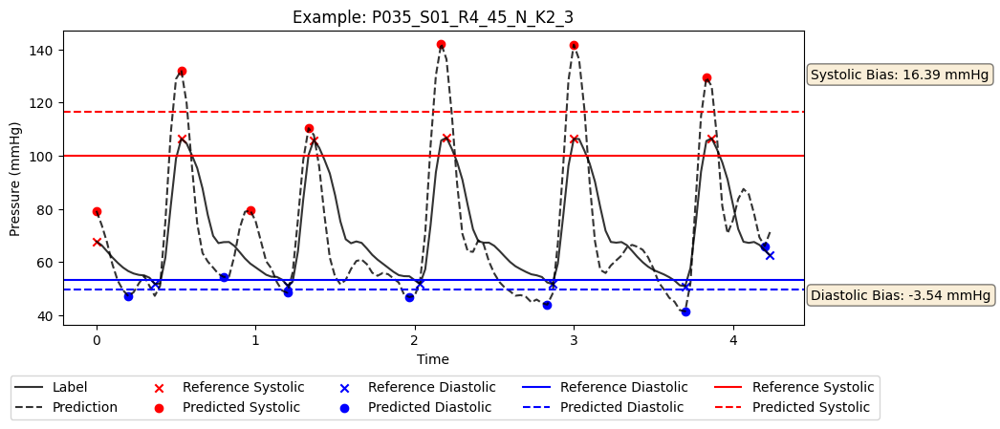

In [114]:
# get the highest macc row
best_metric = 'macc'
best_example = df.iloc[df['auto_snr'].idxmax()-30]
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(len(best_example['label']))/30, best_example['label'], label='Label',color='black',alpha=0.8)
ax.plot(np.arange(len(best_example['prediction']))/30, best_example['prediction'], label='Prediction',color='black',linestyle='--',alpha=0.8)
ax.scatter(best_example['label_max_ids']/30, best_example['label_max_vals'], label='Reference Systolic', color='red', marker='x')
ax.scatter(best_example['pred_max_ids']/30, best_example['pred_max_vals'], label='Predicted Systolic', color='red', marker='o')
ax.scatter(best_example['label_min_ids']/30, best_example['label_min_vals'], label='Reference Diastolic', color='blue', marker='x')
ax.scatter(best_example['pred_min_ids']/30, best_example['pred_min_vals'], label='Predicted Diastolic', color='blue', marker='o')
mean_predicted_systolic = np.mean(best_example['pred_max_vals'])
mean_actual_systolic = np.mean(best_example['label_max_vals'])
mean_predicted_diastolic = np.mean(best_example['pred_min_vals'])
mean_actual_diastolic = np.mean(best_example['label_min_vals'])
ax.axhline(y=mean_actual_diastolic, color='blue', linestyle='-', label='Reference Diastolic')
ax.axhline(y=mean_predicted_diastolic, color='blue', linestyle='--', label='Predicted Diastolic')
ax.axhline(y=mean_actual_systolic, color='red', linestyle='-', label='Reference Systolic')
ax.axhline(y=mean_predicted_systolic, color='red', linestyle='--', label='Predicted Systolic')
ax.set_title(f"Example: {best_example['video_section']}")
ax.set_xlabel("Time")
ax.set_ylabel("Pressure (mmHg)")
ax.legend(bbox_to_anchor=(-0.08, -0.15), loc='upper left',ncol=5)
systolic_difference = mean_predicted_systolic - mean_actual_systolic
diastolic_difference = mean_predicted_diastolic - mean_actual_diastolic
# add text box with systolic and diastolic difference
systextstr = f"Systolic Bias: {systolic_difference:.2f} mmHg"
diatextstr = f"Diastolic Bias: {diastolic_difference:.2f} mmHg"
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(1.01, 0.85, systextstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='center', bbox=props)
ax.text(1.01, 0.1, diatextstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='center', bbox=props)
plt.show()

In [110]:
stat_map = {'Mean': mean_df,
            'Systolic': max_df,
            'Diastolic': min_df}

In [13]:
# # for each participant and 
# snr_com_df = df.loc[df.groupby(['participant', 'posture','camera'])['auto_snr'].idxmax()].reset_index(drop=True)
# # drop the values where auto_snr is less than snr
# # snr_com_df = snr_com_df[snr_com_df['auto_snr'] > snr_com_df['snr']]
# sns.scatterplot(data=snr_com_df, x='snr', y='auto_snr', hue='participant', style='posture')
# plt.title("SNR vs Auto SNR by Posture and Camera")
# plt.xlabel("SNR")
# plt.ylabel("Auto SNR")
# plt.legend(title='Posture/Camera', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.show()

# # plot the scatterplot of auto_snr vs macc
# sns.scatterplot(data=snr_com_df, x='auto_snr', y='macc', size='participant',hue='participant',style='participant')
# # sns.scatterplot(data=snr_com_df, x='snr', y='macc',label='snr')
# plt.title("Auto SNR vs MACC by Posture and Camera")
# plt.xlabel("Auto SNR")
# plt.ylabel("MACC")
# plt.legend(title='Legend', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.show()

# # plot the scatterplot of auto_snr vs macc
# sns.scatterplot(data=snr_com_df, x='snr', y='macc', size='participant',hue='participant',style='participant')
# # sns.scatterplot(data=snr_com_df, x='snr', y='macc',label='snr')
# plt.title("SNR vs MACC by Posture and Camera")
# plt.xlabel("SNR")
# plt.ylabel("MACC")
# plt.legend(title='Legend', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.show()

# # for idx, row in snr_com_df.iterrows():
# #     # plot a lineplot of the prediction and label
# #     plt.figure(figsize=(10, 4))
# #     plt.plot(row['prediction'], label='Prediction')
# #     plt.plot(row['label'], label='Label')
# #     plt.title(f"Predictions vs Labels for {row['video_section']} (SNR: {row['snr']:.2f}, Auto SNR: {row['auto_snr']:.2f})")
# #     plt.xlabel("Time")
# #     plt.ylabel("Signal Value")
# #     plt.legend()
# #     plt.show()

### Without Aggregation

In [96]:
def process_stat_df(stat: str, stat_df: pd.DataFrame,hue='camera',style=None) -> tuple[sns.axisgrid.JointGrid, pd.DataFrame]:
    stat_df['bias'] = stat_df['prediction'] - stat_df['label']
    stat_df['mean'] = (stat_df['prediction'] + stat_df['label']) / 2
    mean_bias = stat_df['bias'].mean()
    std_bias = stat_df['bias'].std()
    upper_limit = mean_bias + 1.96 * std_bias
    lower_limit = mean_bias - 1.96 * std_bias
    jp = sns.jointplot(data=stat_df, x="mean", y="bias",hue=hue,kind='scatter',style=style,marginal_kws={'multiple':'layer', 'common_norm':False, 'fill':True, 'alpha':0.2})
    # jp.plot_marginals(sns.kdeplot, fill=True, alpha=0.5, common_norm=False)
    # get the equation of the line of best fit from jp
    jp.ax_joint.axhline(mean_bias, color='red', linestyle='--', label='Mean Bias')
    jp.ax_joint.axhline(upper_limit, color='blue', linestyle='--', label='Limits (±1.96 SD)')
    jp.ax_joint.axhline(lower_limit, color='blue', linestyle='--', label='_nolegend_')
    jp.ax_joint.axhline(0, color='black', linestyle='-', linewidth=1, label='Zero Bias')
    jp.ax_joint.fill_between(jp.ax_joint.get_xlim(), 10, -10, color='gray', alpha=0.3)
    # add filled lines 
    jp.ax_joint.set_xlabel('Mean of Prediction and Label',fontdict={'size':12})
    jp.ax_joint.set_ylabel('Bias (Prediction - Label)',fontdict={'size':12})
    # calculate the regression line for bias vs mean
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(stat_df['mean'], stat_df['bias'])
    # plot the regression line with alpha for std error as shaded area
    x_vals = np.array(jp.ax_joint.get_xlim())
    y_vals = intercept + slope * x_vals
    jp.ax_joint.plot(x_vals, y_vals, color='green', label='Regression Line')
    # add shaded area for std error
    y_err = std_err * x_vals
    jp.ax_joint.fill_between(x_vals, y_vals - y_err, y_vals + y_err, color='green', alpha=0.2)
    jp.ax_joint.legend(bbox_to_anchor=(-0.90, 1.1), loc='upper left', ncol=2)
    # under the legend, print the regression equation, r-squared value, and p-value
    equation_text = f"\
    y = {slope:.2f}x + {intercept:.2f}\n\
    R² = {r_value**2:.3f}\n\
    p = {p_value:2.2e}\n\
    SE = {std_err:.2f}"
    jp.ax_joint.text(0.05, 0.9, equation_text, transform=jp.ax_joint.transAxes,
                    fontsize=10, verticalalignment='center')
    
    # get summary stats and add those to a text box on the right side of the plot
    summary_df = get_summary_stats(stat_df)
    # Format numeric columns
    for col in ['Mean','SE','SD']:
        summary_df[col] = summary_df[col].apply(lambda x: f'{x:.2f}' if pd.notna(x) else '-')
    # Add table to plot
    table = jp.ax_joint.table(cellText=summary_df.values.tolist(), 
                            colLabels=summary_df.columns.tolist(),
                            cellLoc='center',
                            loc='center',
                            # [x, y, width, height]
                            bbox=[1.25, 0.50, 0.5, 0.5],
                            )  
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 1.5)  # Adjust cell height

    # Style header row
    for i in range(len(summary_df.columns)):
        table[(0, i)].set_facecolor('#E8E8E8')
        table[(0, i)].set_text_props(weight='bold')
    # add suptitle
    jp.figure.suptitle(f'{stat} Pressure', fontsize=16, y=1.02)
    return jp, summary_df

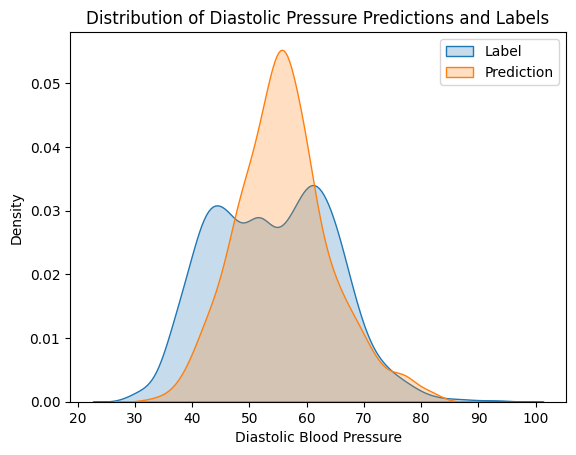

In [108]:
sns.kdeplot(x=min_df['label'], fill=True,label='Label')
sns.kdeplot(x=min_df['prediction'], fill=True,label='Prediction')
plt.title("Distribution of Diastolic Pressure Predictions and Labels")
plt.xlabel("Diastolic Blood Pressure")
plt.ylabel("Density")
plt.legend()
plt.show()

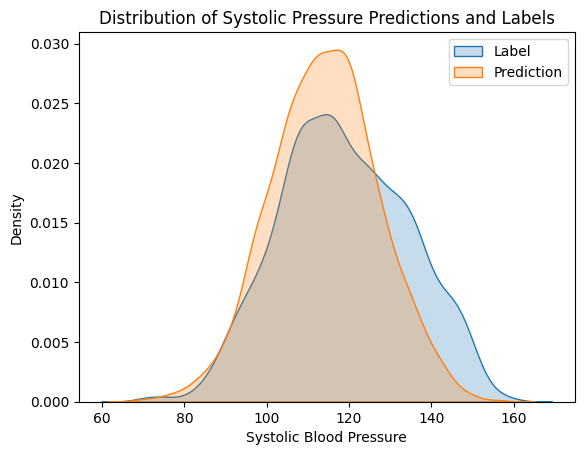

In [107]:
sns.kdeplot(x=max_df['label'], fill=True,label='Label')
sns.kdeplot(x=max_df['prediction'], fill=True,label='Prediction')
plt.title("Distribution of Systolic Pressure Predictions and Labels")
plt.xlabel("Systolic Blood Pressure")
plt.ylabel("Density")
plt.legend()
plt.show()

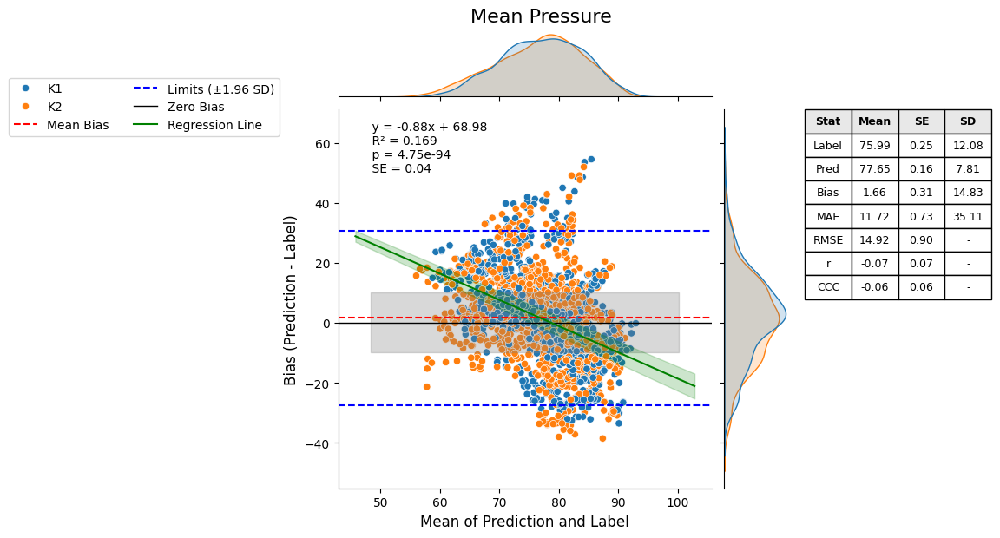

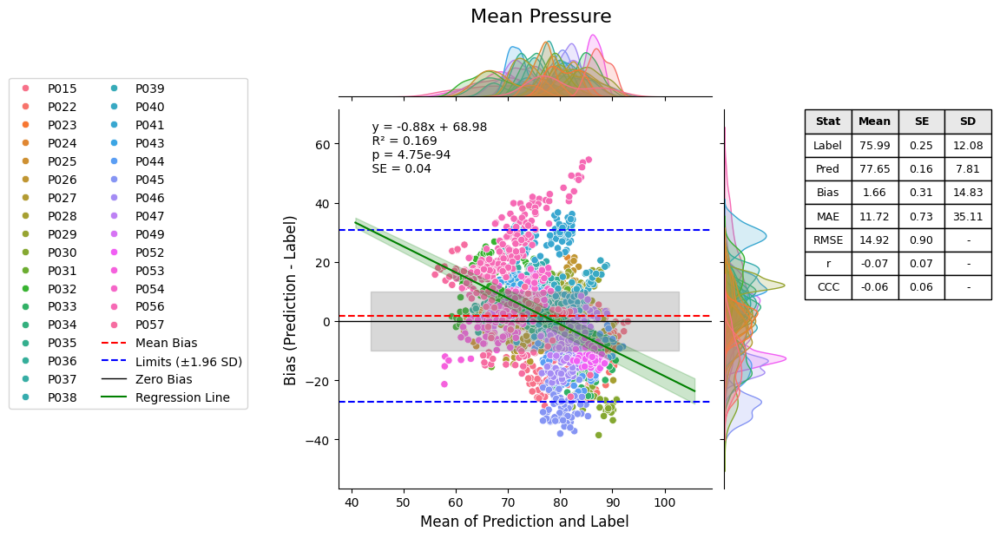

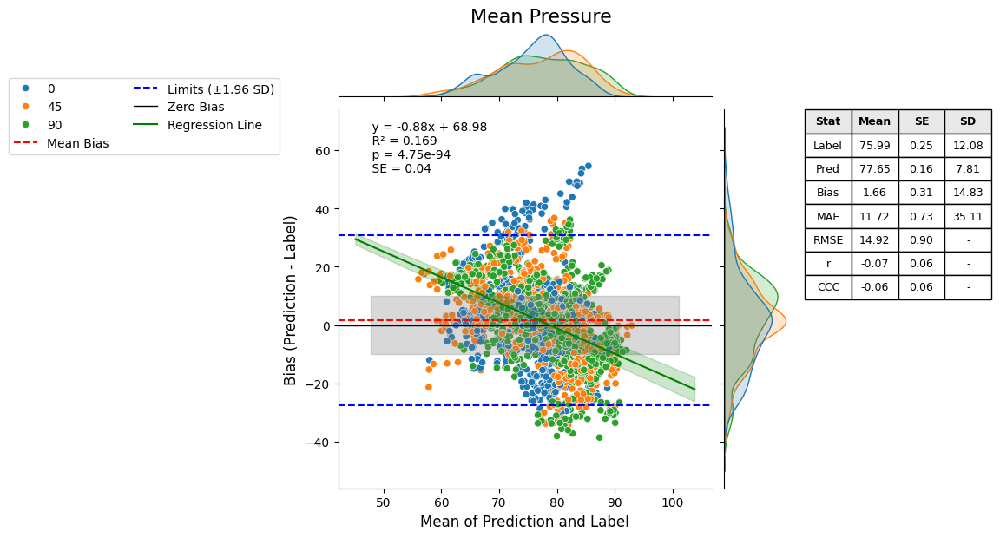

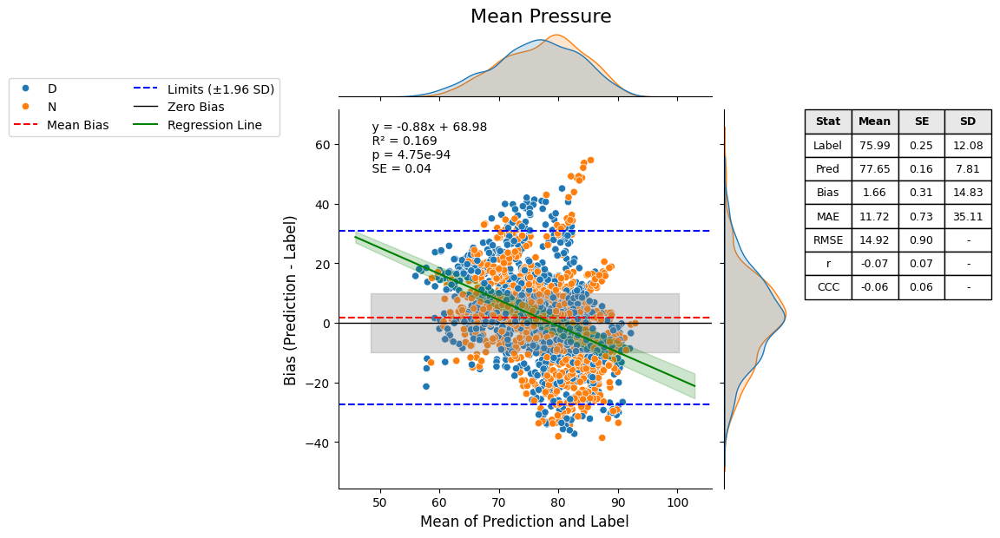

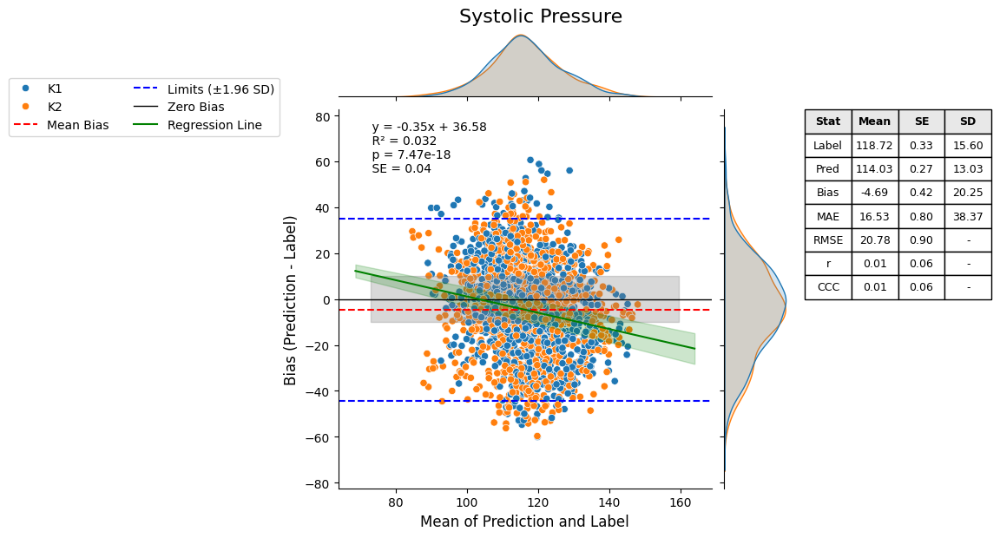

...

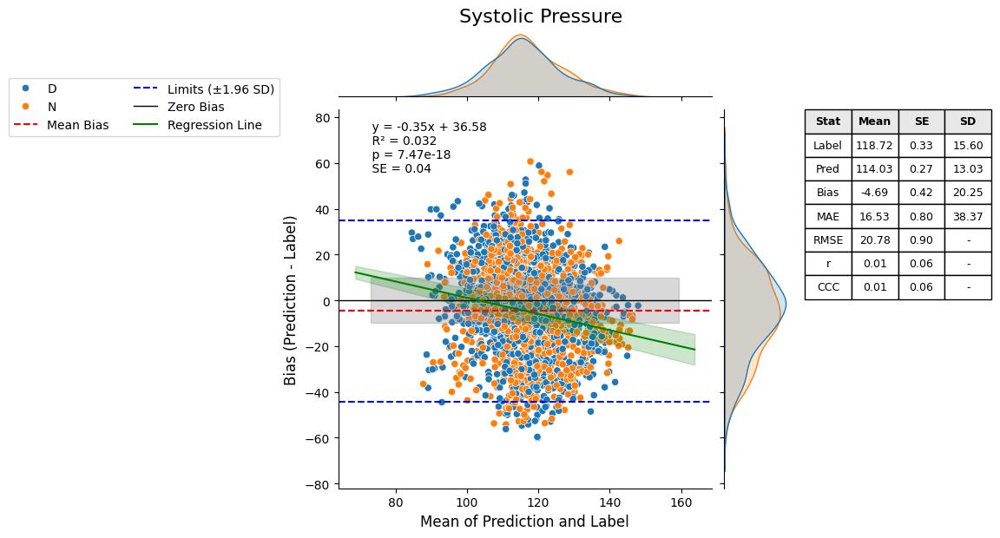

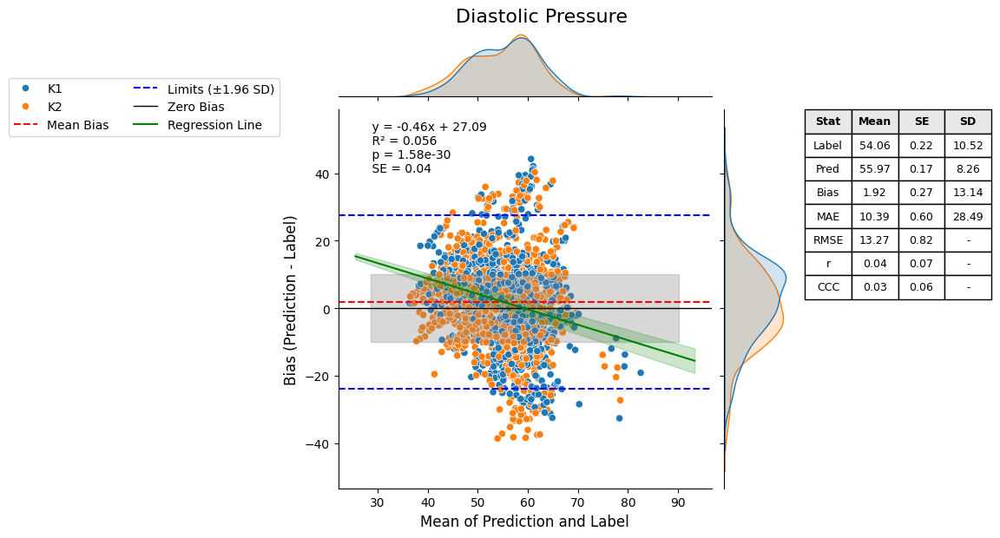

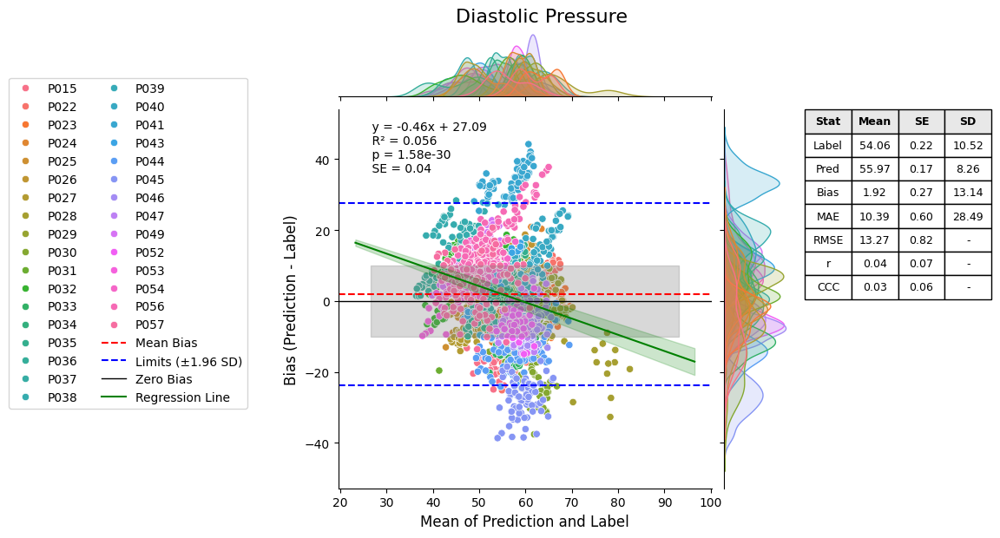

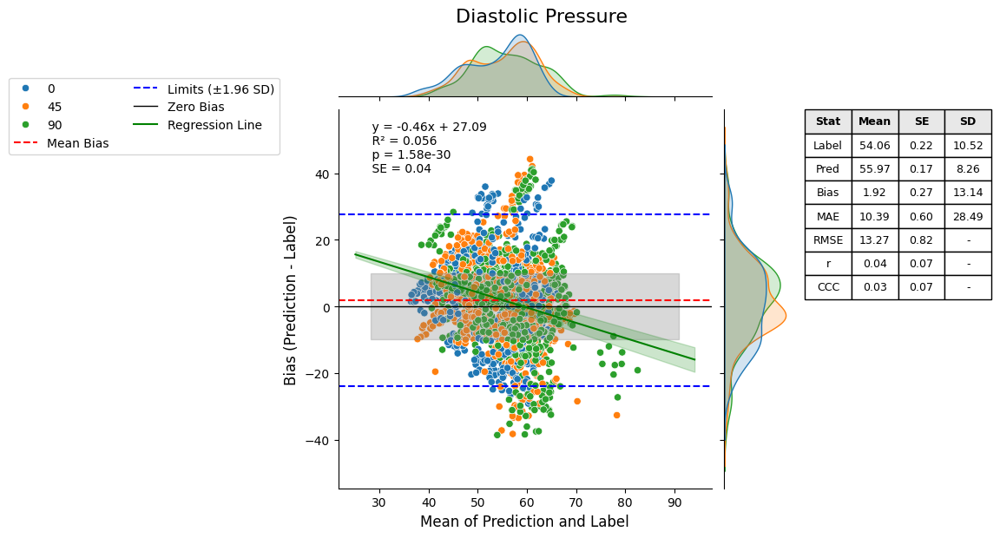

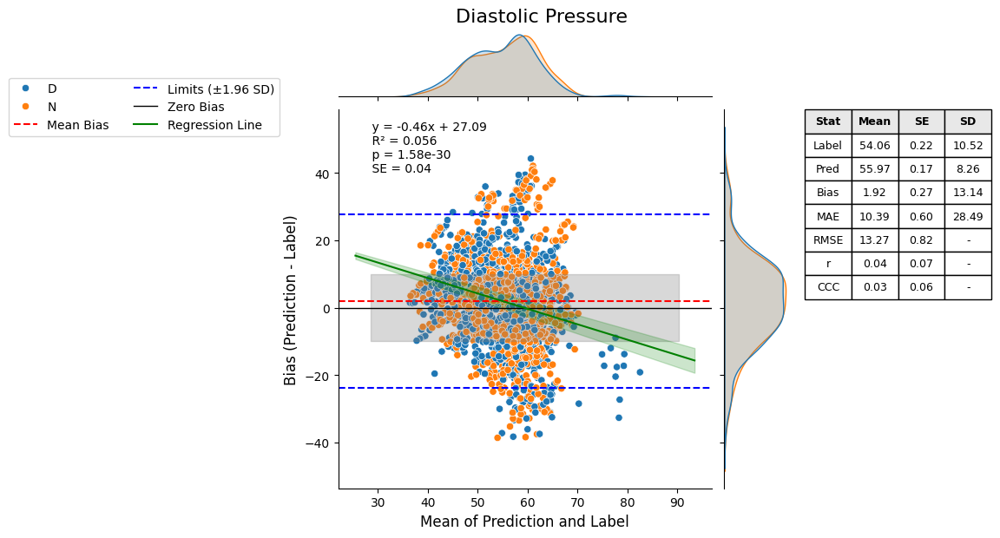

In [111]:
for stat, stat_df in stat_map.items():
    jp, summary_df = process_stat_df(stat, stat_df,hue='camera')
    jp, summary_df = process_stat_df(stat,stat_df,hue='participant')
    jp, summary_df = process_stat_df(stat, stat_df,hue='posture')
    jp, summary_df = process_stat_df(stat, stat_df,hue='depth')

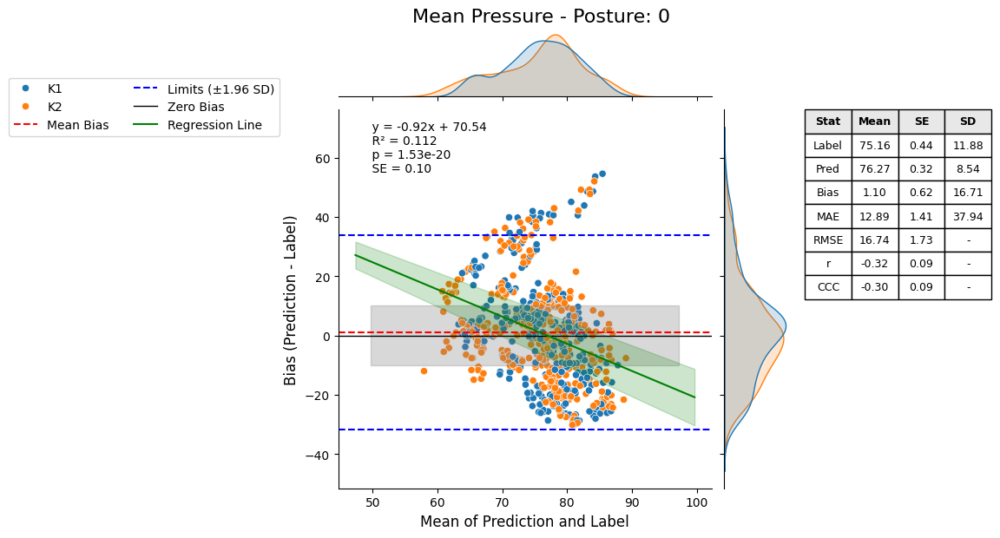

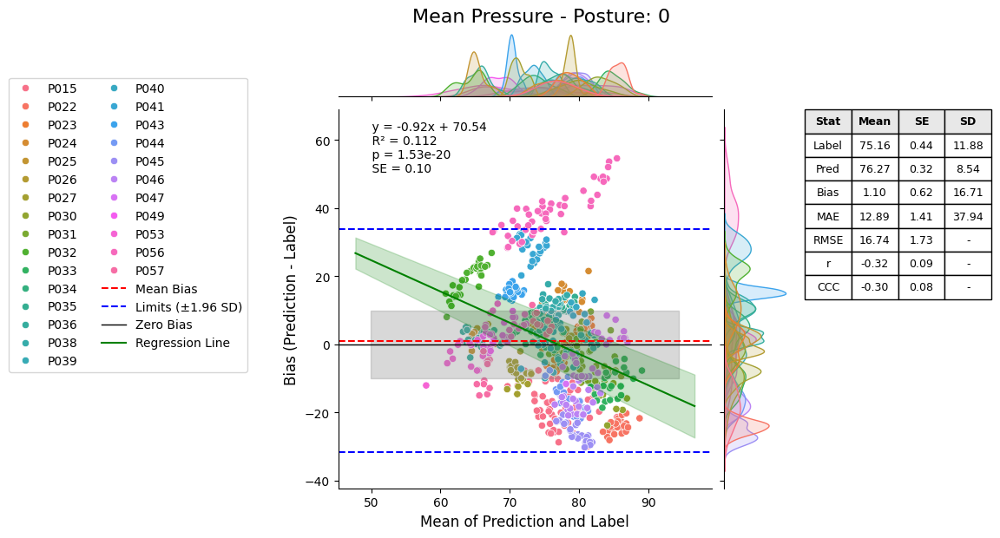

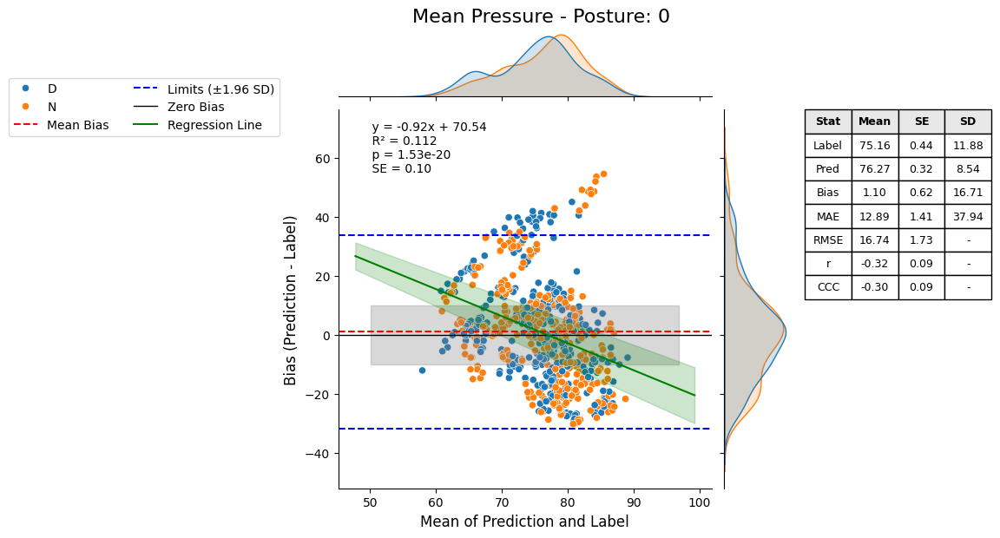

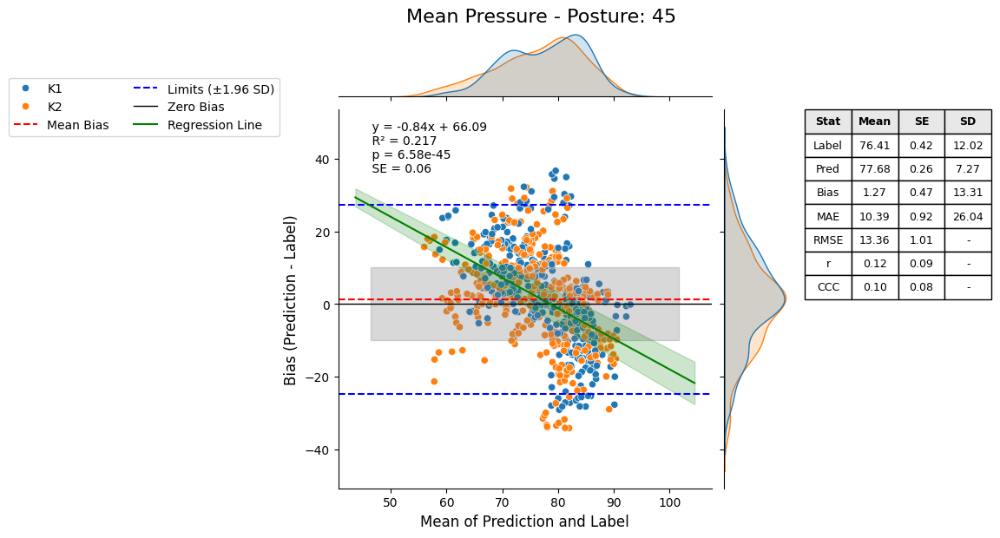

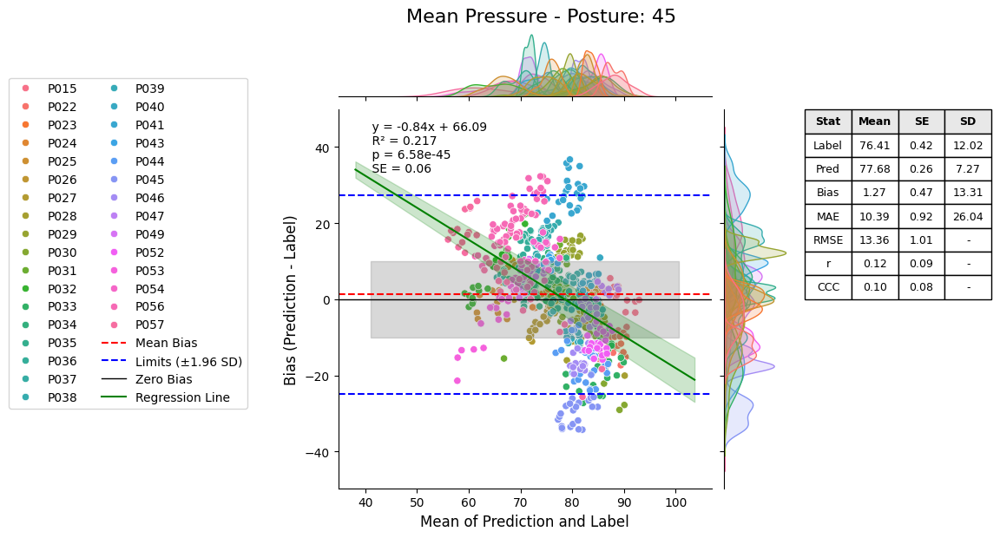

...

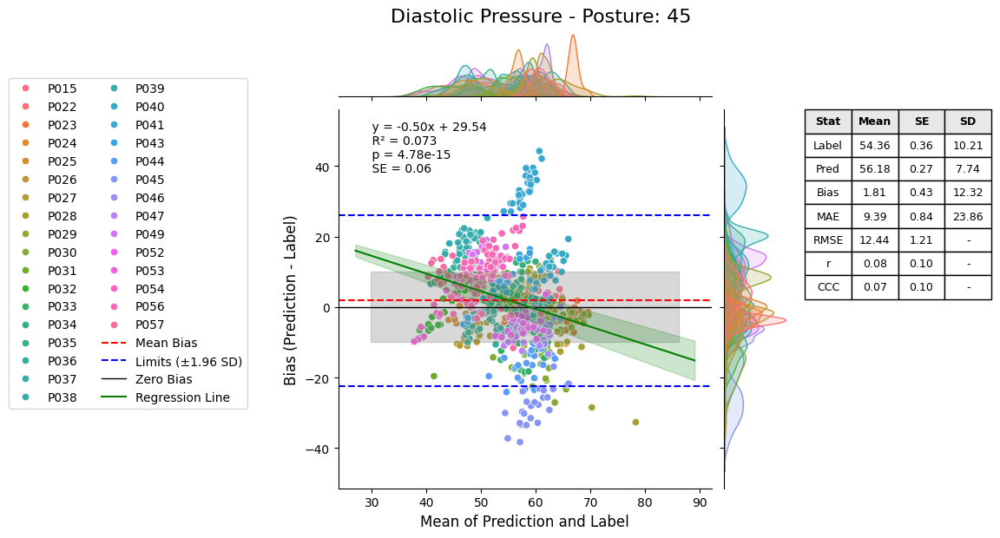

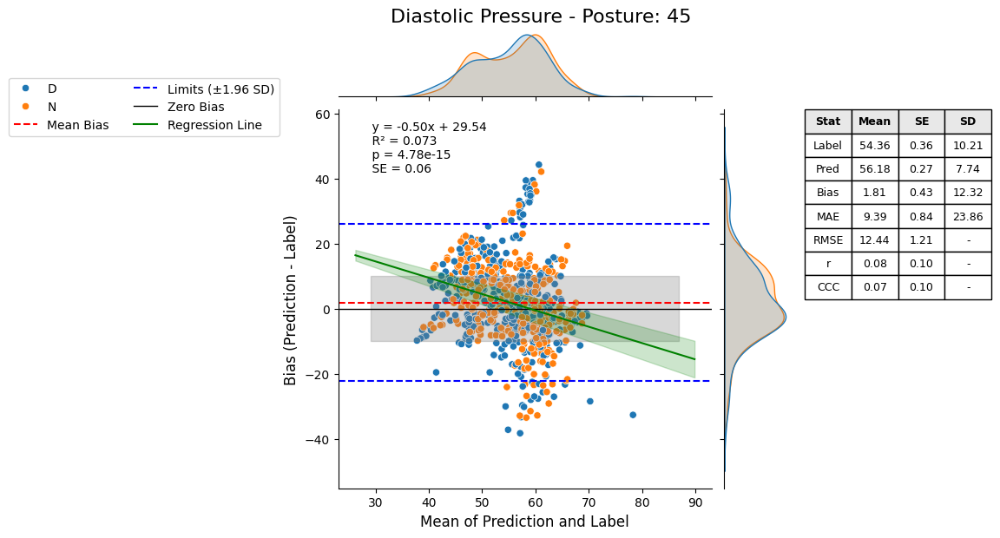

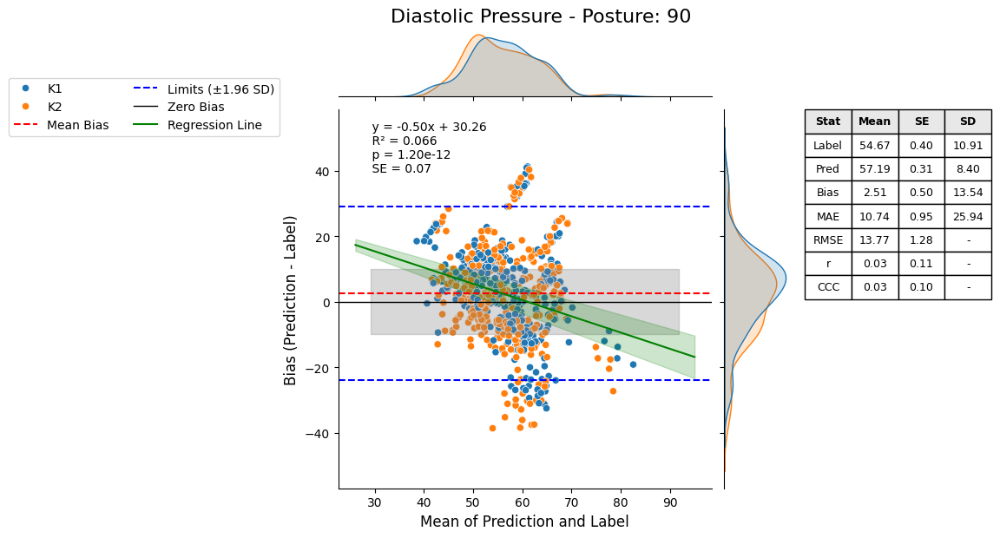

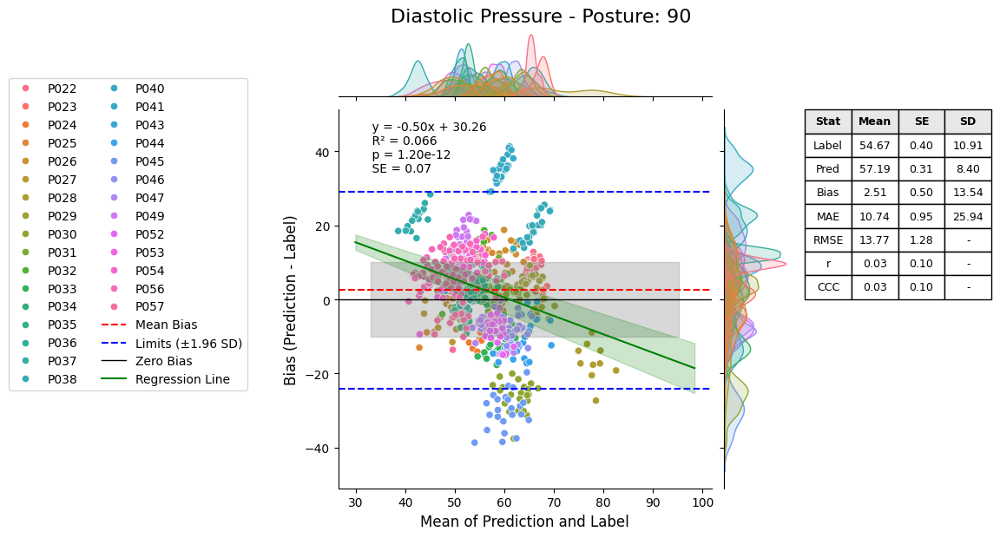

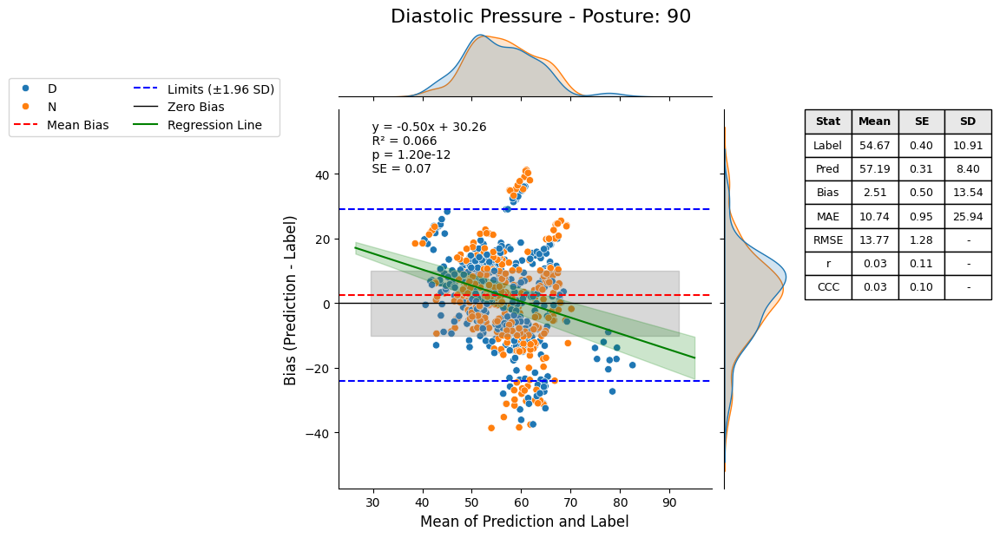

In [112]:
for stat, stat_df in stat_map.items():
    # group stat_df by posture, then process each group separately
    for posture, group_df in stat_df.groupby('posture'):
        jp, summary_df = process_stat_df(stat, group_df,hue='camera')
        jp.figure.suptitle(f'{stat} Pressure - Posture: {posture}', fontsize=16, y=1.02)
        plt.show(jp.figure)
        jp, summary_df = process_stat_df(stat,group_df,hue='participant')
        jp.figure.suptitle(f'{stat} Pressure - Posture: {posture}', fontsize=16, y=1.02)
        plt.show(jp.figure)
        jp, summary_df = process_stat_df(stat, group_df,hue='depth')
        jp.figure.suptitle(f'{stat} Pressure - Posture: {posture}', fontsize=16, y=1.02)
        plt.show(jp.figure)
        plt.close('all')

### Grouping by auto_snr

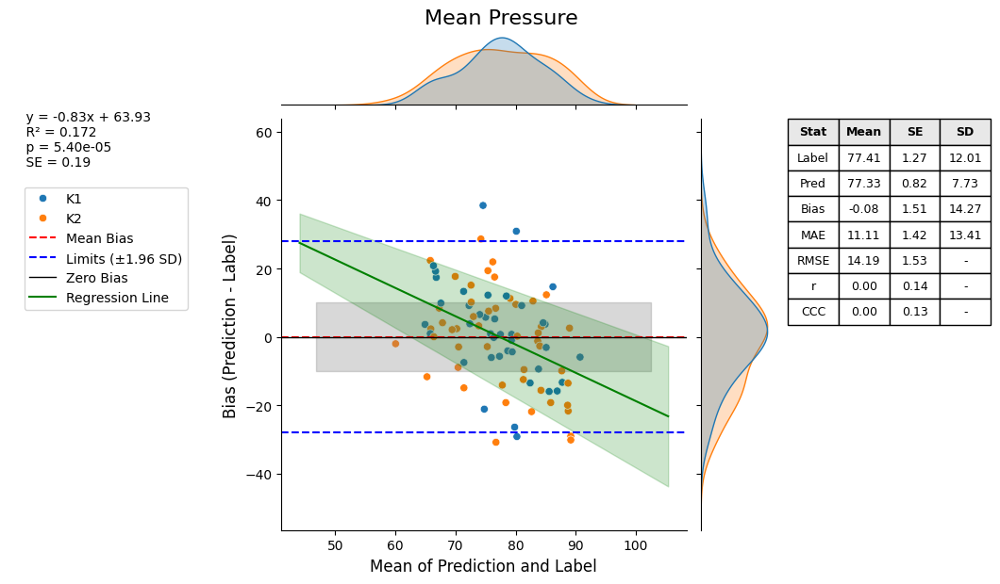

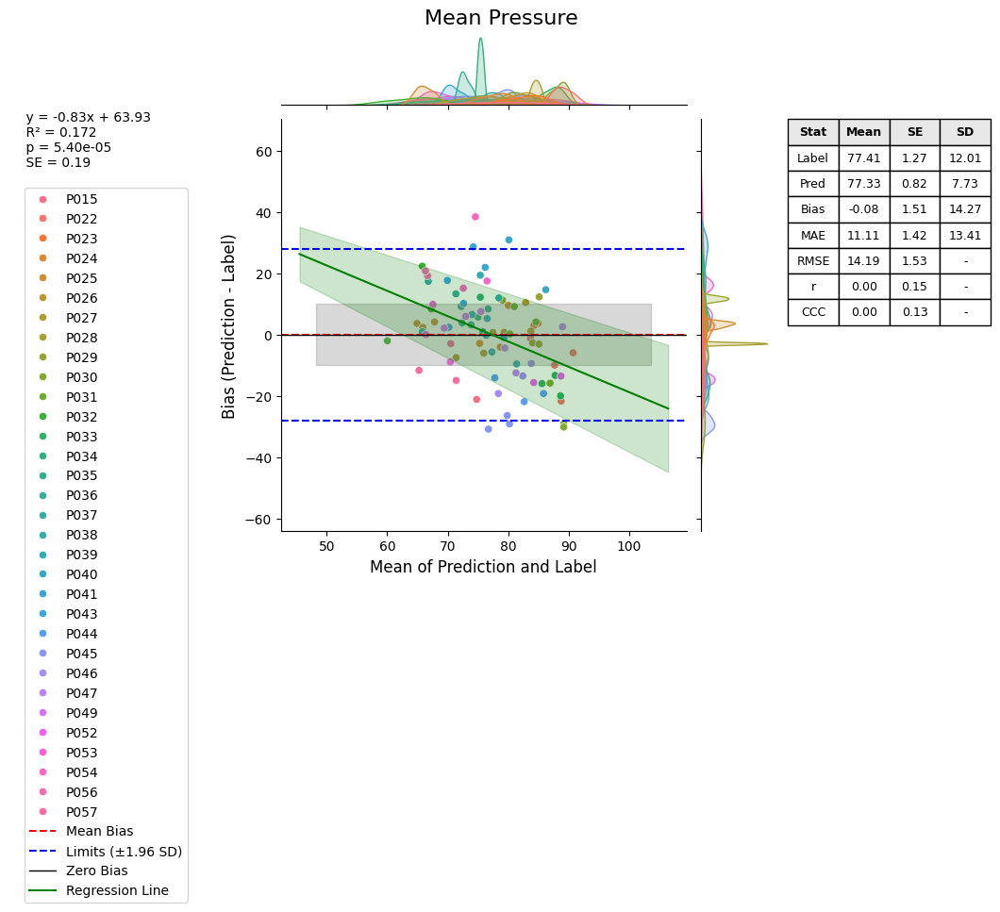

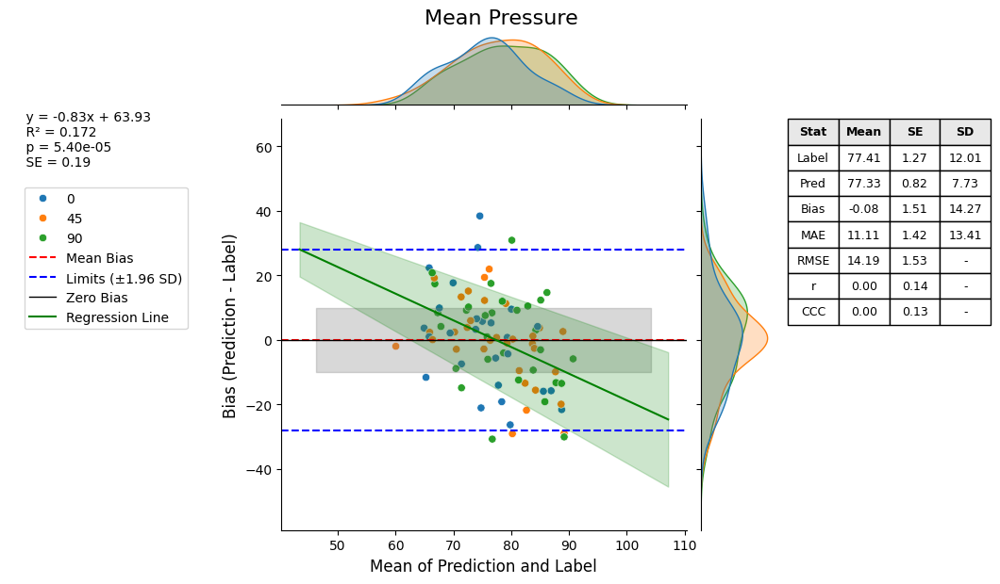

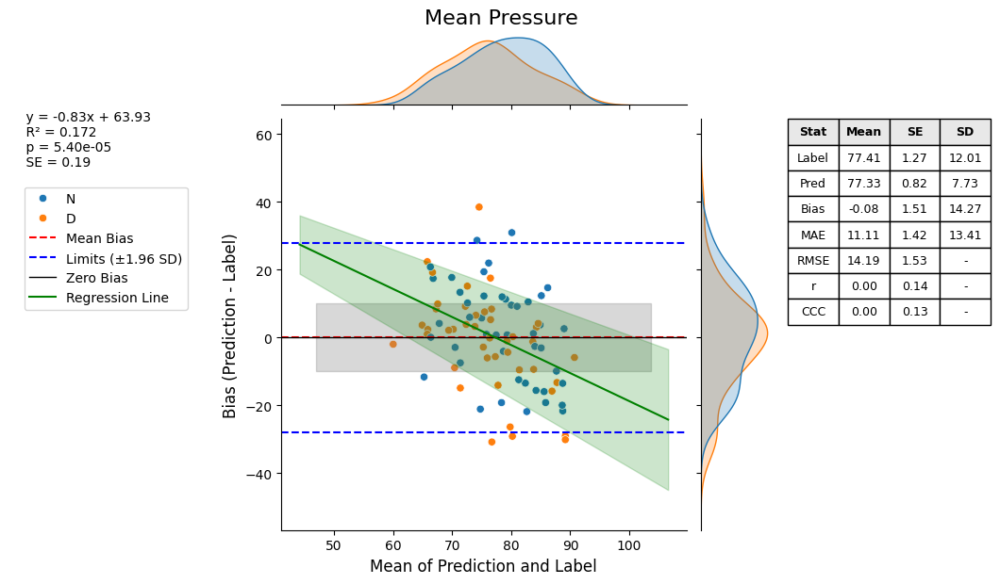

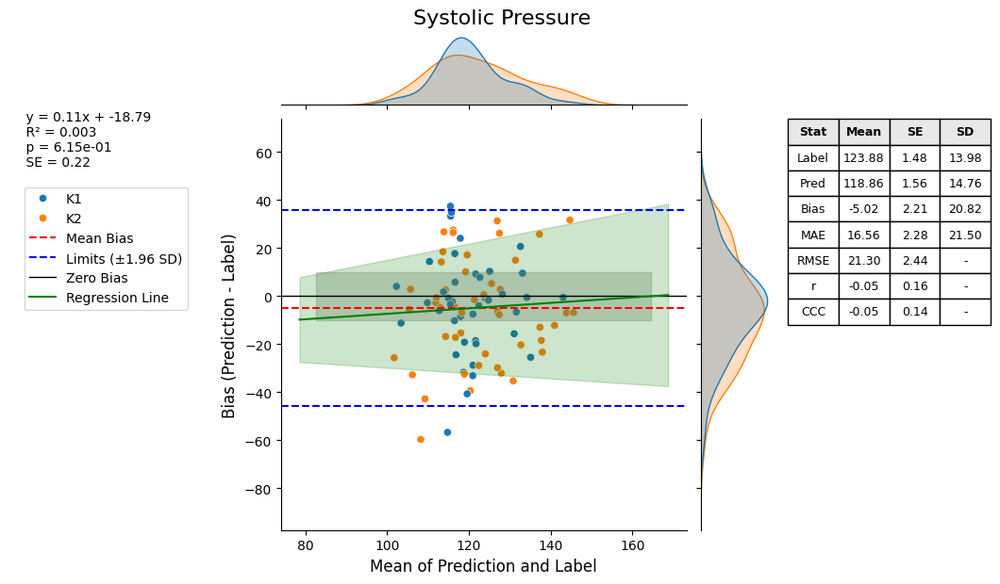

...

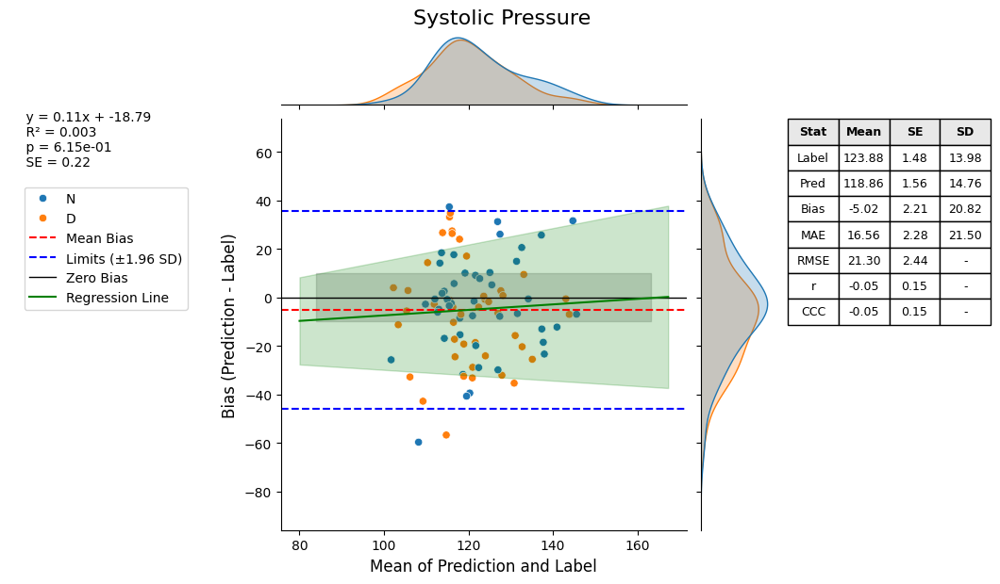

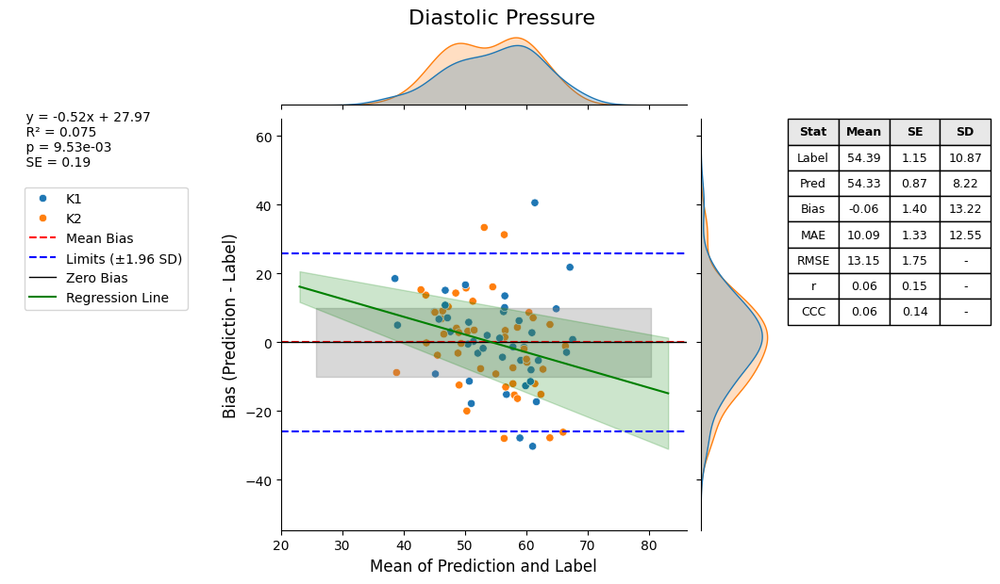

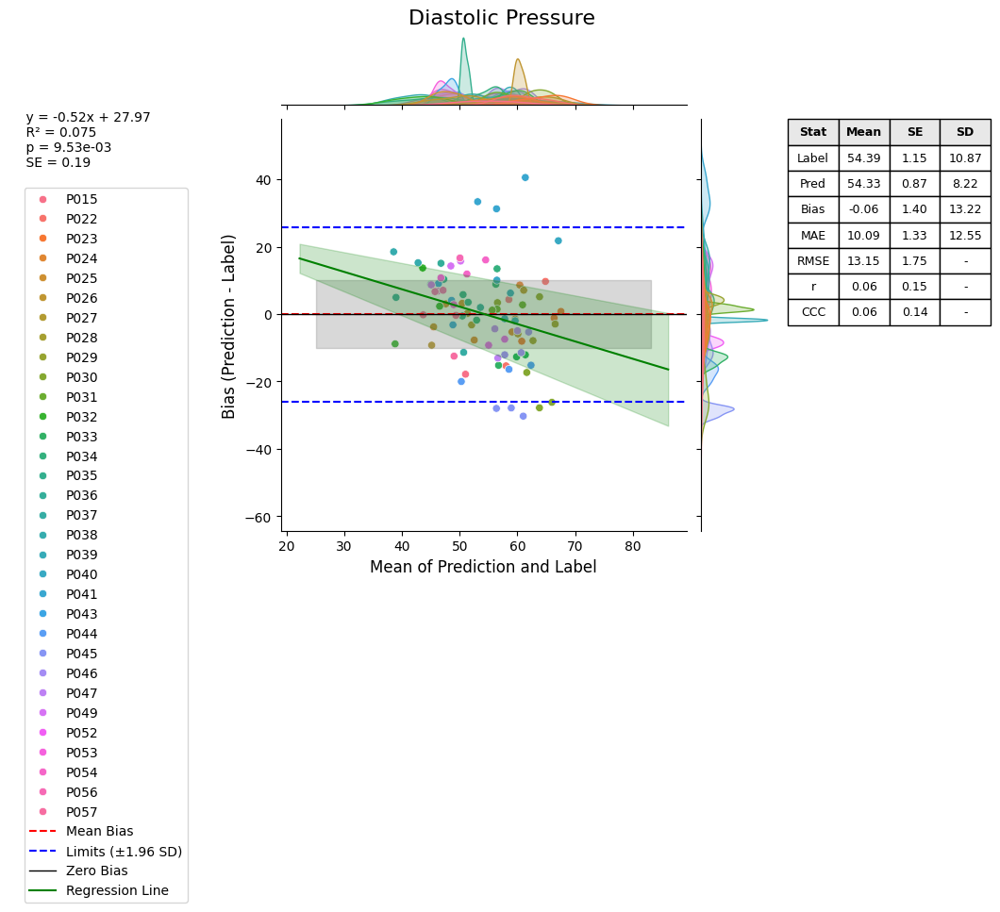

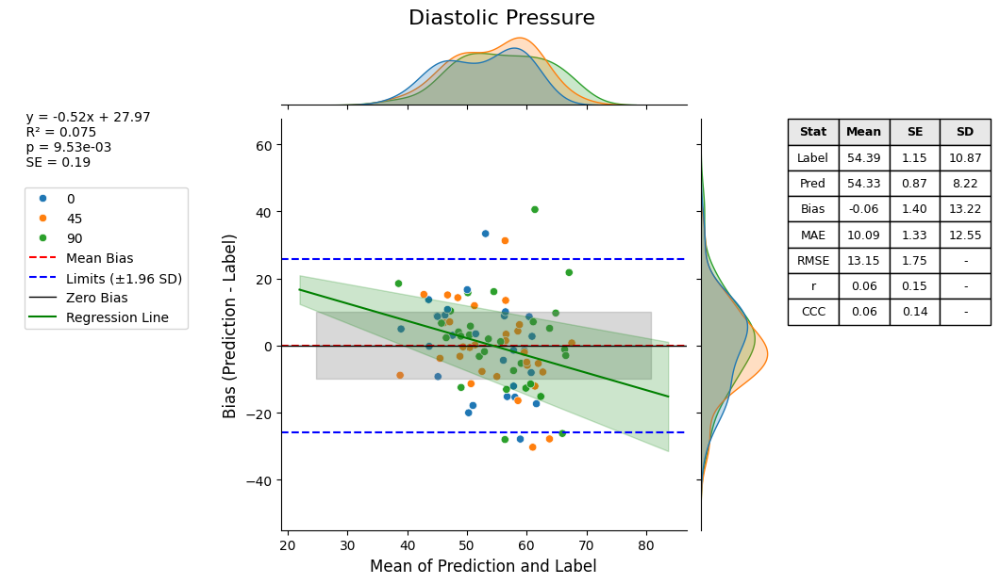

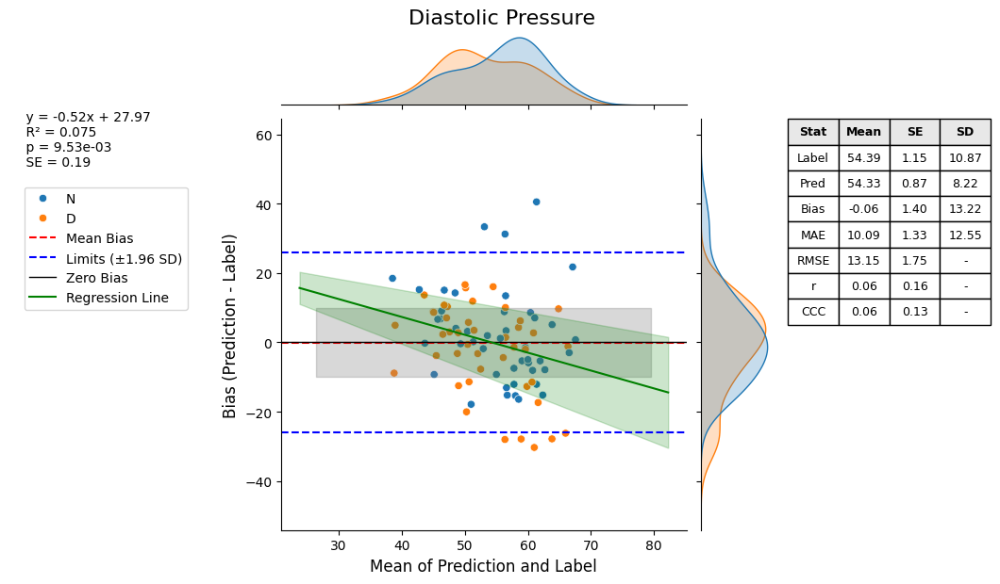

In [17]:
auto_snr_statmap = stat_map = { 'Mean': mean_df.loc[mean_df.groupby(['participant', 'posture'])['auto_snr'].idxmax()].reset_index(drop=True),
                                'Systolic': max_df.loc[max_df.groupby(['participant', 'posture'])['auto_snr'].idxmax()].reset_index(drop=True),
                                'Diastolic': min_df.loc[min_df.groupby(['participant', 'posture'])['auto_snr'].idxmax()].reset_index(drop=True)}
for stat, stat_df in auto_snr_statmap.items():
    jp, summary_df = process_stat_df(stat, stat_df,hue='camera')
    jp, summary_df = process_stat_df(stat,stat_df,hue='participant')
    jp, summary_df = process_stat_df(stat, stat_df,hue='posture')
    jp, summary_df = process_stat_df(stat, stat_df,hue='depth')

## grouping by snr

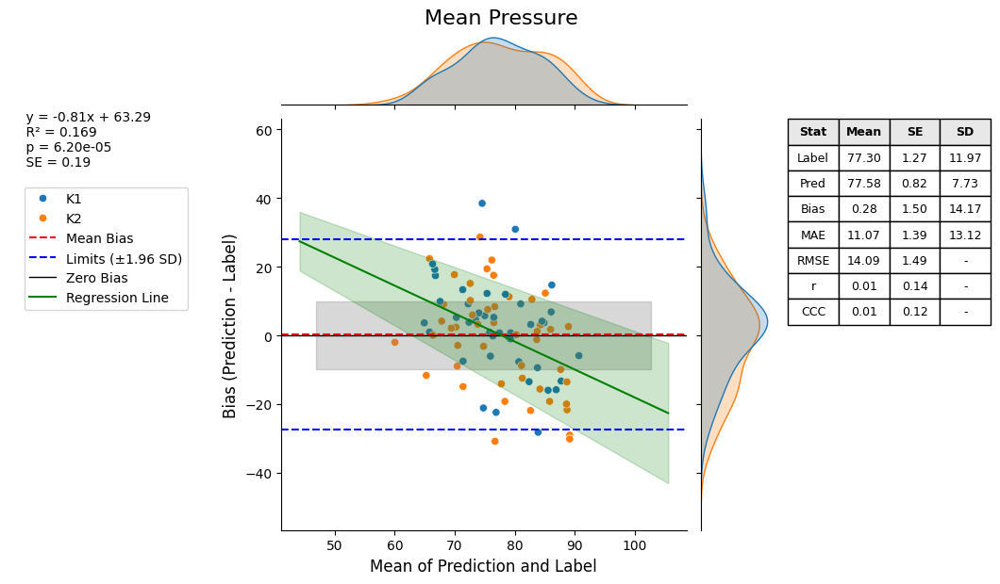

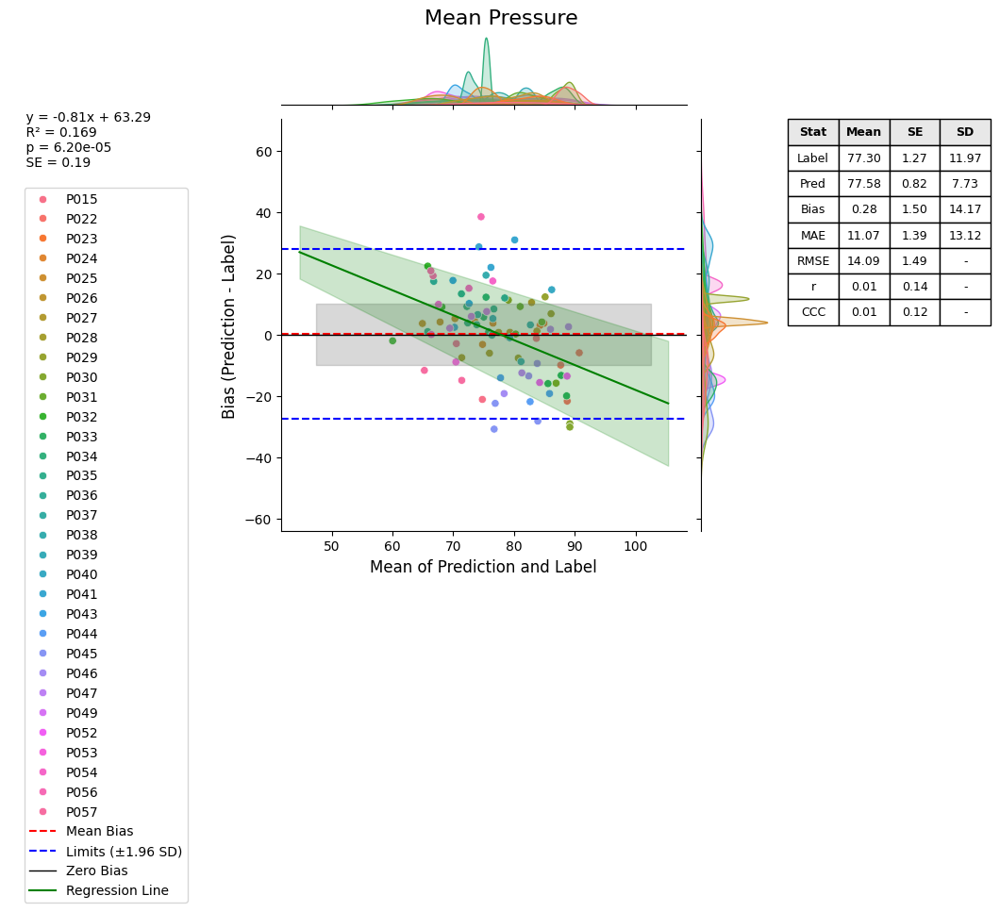

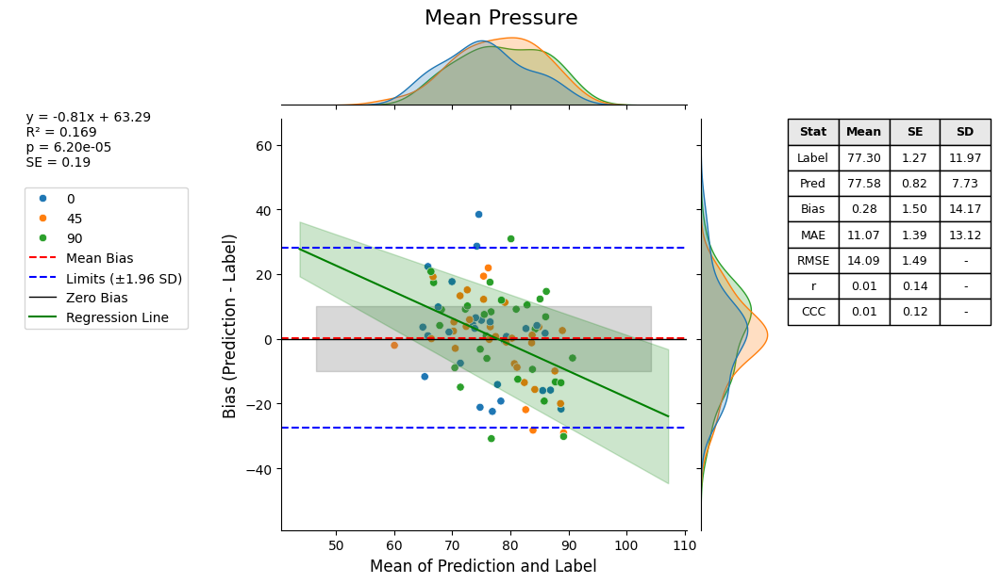

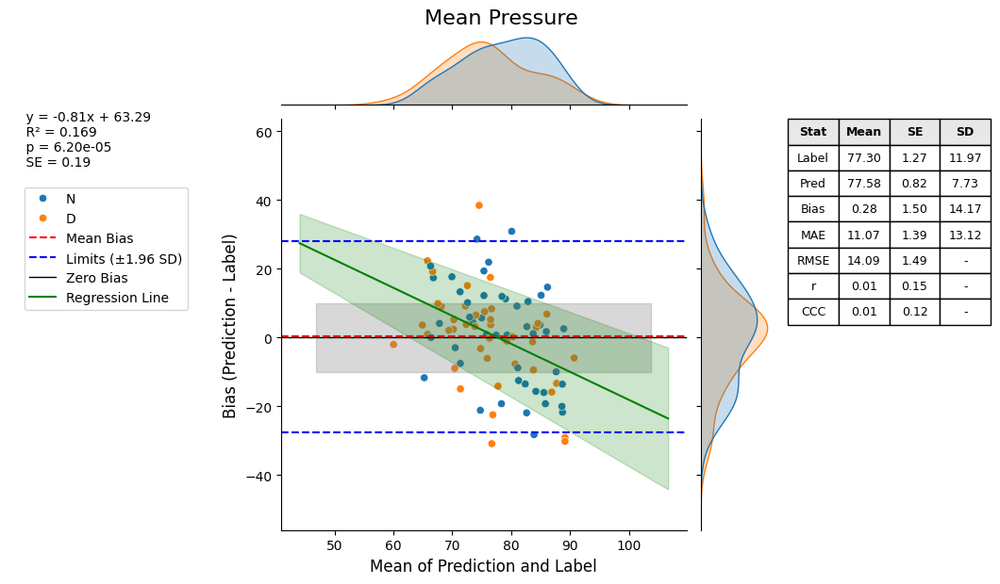

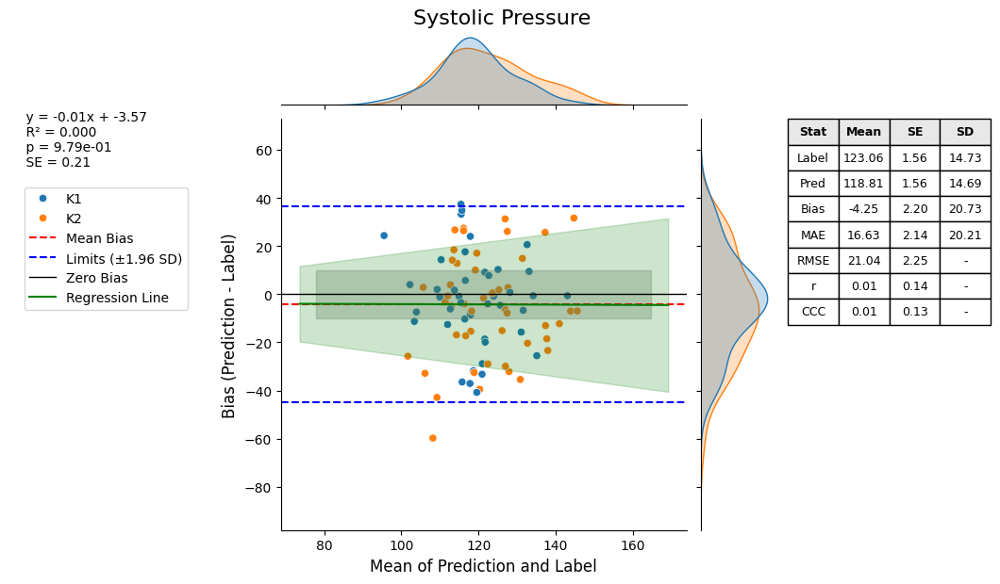

...

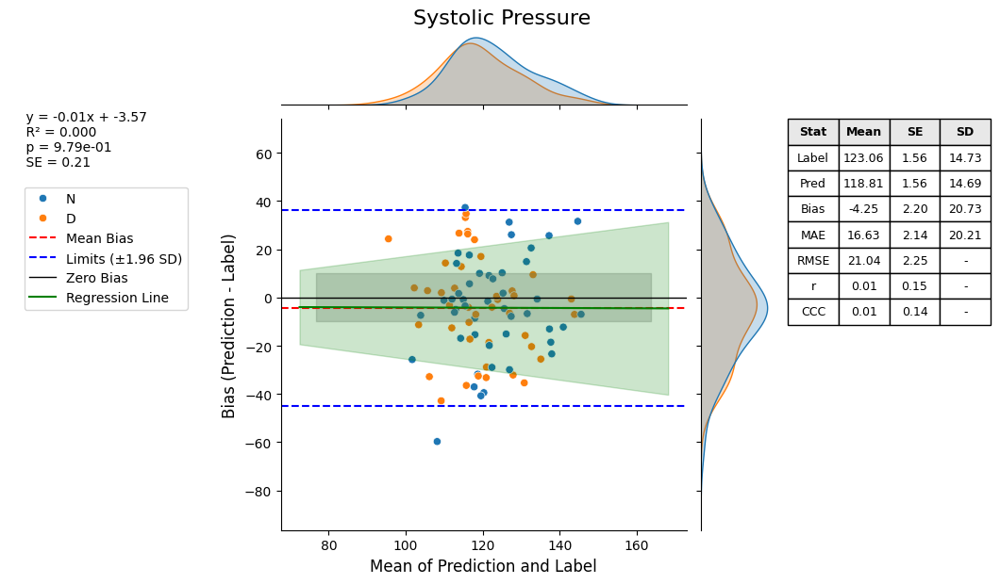

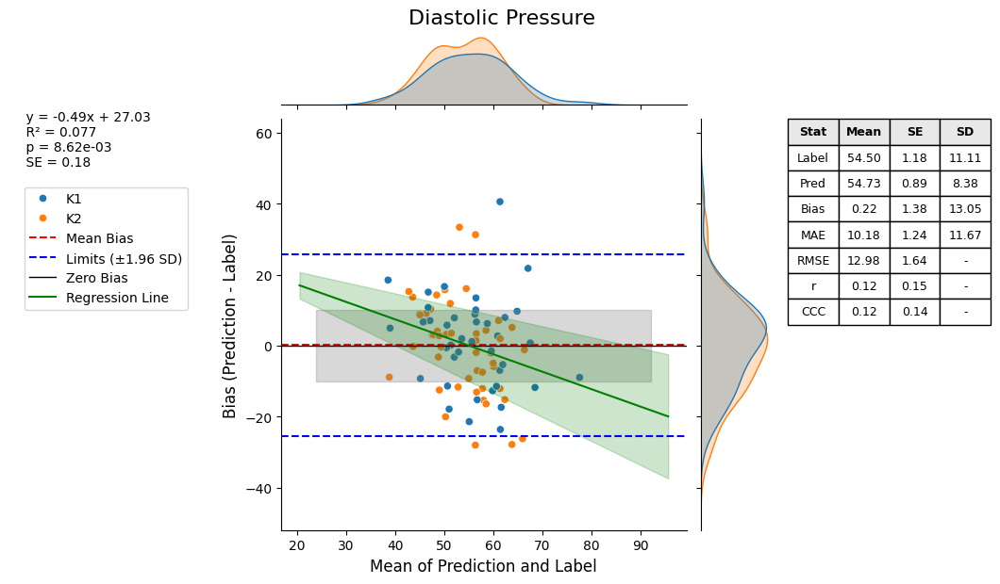

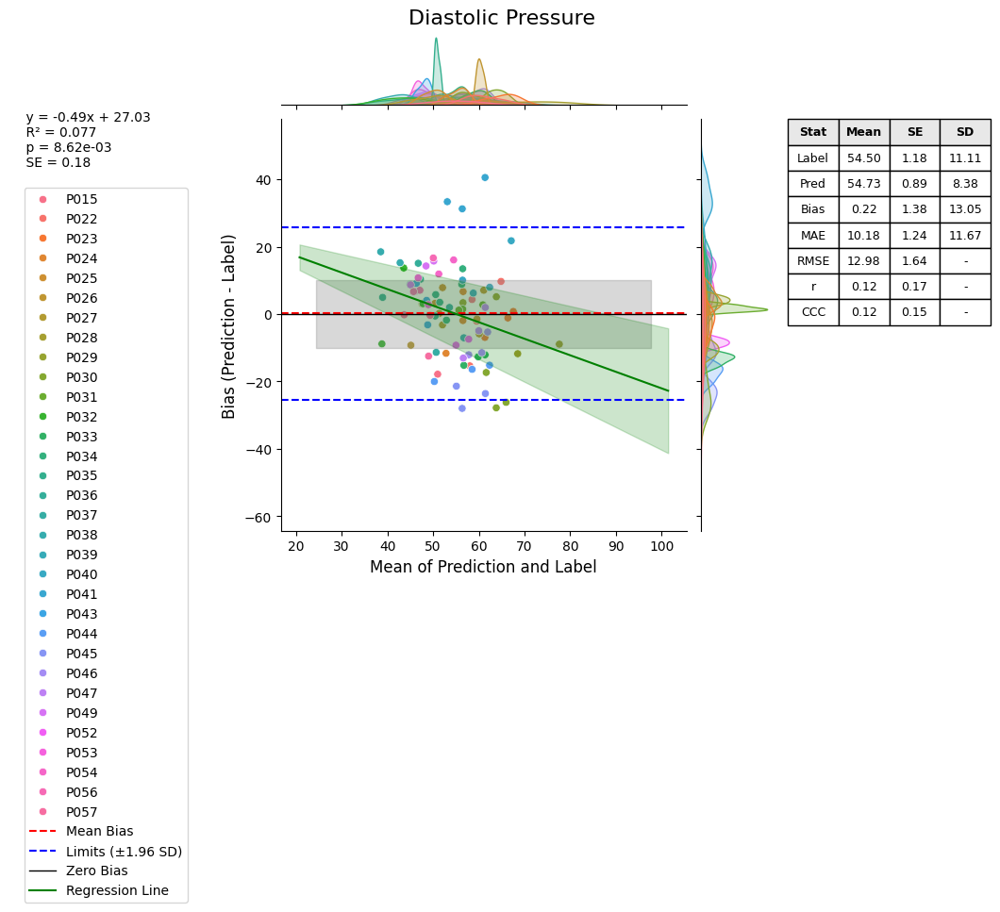

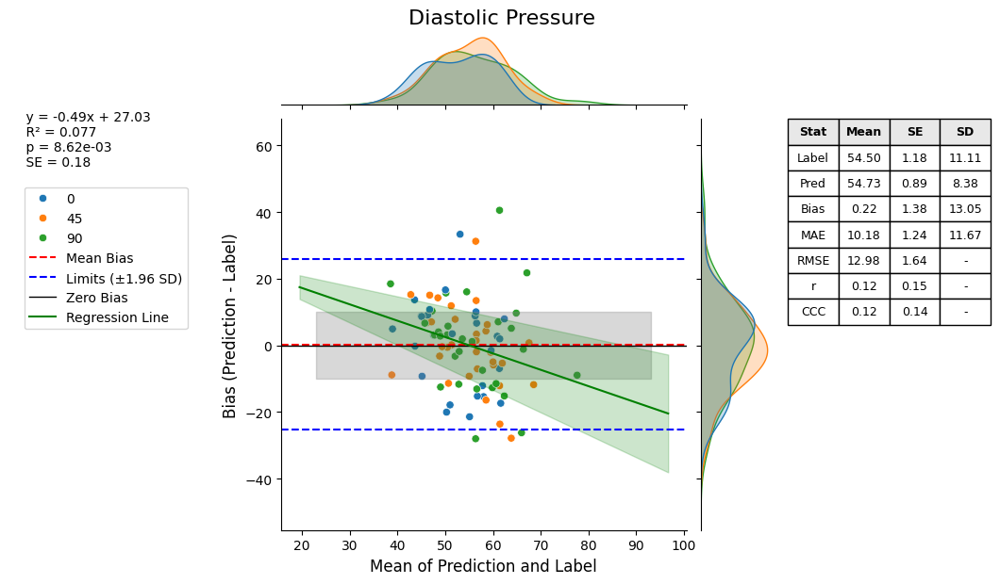

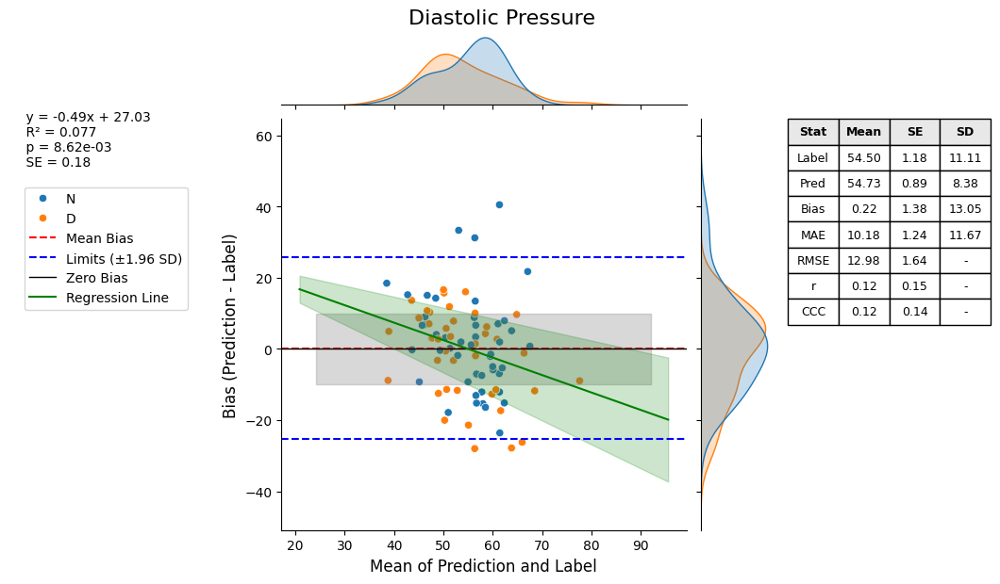

In [18]:
snr_statmap = stat_map = { 'Mean': mean_df.loc[mean_df.groupby(['participant', 'posture'])['snr'].idxmax()].reset_index(drop=True),
                                'Systolic': max_df.loc[max_df.groupby(['participant', 'posture'])['snr'].idxmax()].reset_index(drop=True),
                                'Diastolic': min_df.loc[min_df.groupby(['participant', 'posture'])['snr'].idxmax()].reset_index(drop=True)}
for stat, stat_df in snr_statmap.items():
    jp, summary_df = process_stat_df(stat, stat_df,hue='camera')
    jp, summary_df = process_stat_df(stat,stat_df,hue='participant')
    jp, summary_df = process_stat_df(stat, stat_df,hue='posture')
    jp, summary_df = process_stat_df(stat, stat_df,hue='depth')

# Aggregating

In [ ]:
total_stats = {}
aggregate_by = 'video_section'
for statistic, stat_df in stat_map.items():
    stats = {}
    agg_df = aggregate_data(stat_df, by=[aggregate_by], method='HAC', kernel='QS', fs=fs)
    agg_df['participant'] = agg_df[aggregate_by].apply(lambda x: x.split('_')[0])
    agg_df['session'] = agg_df[aggregate_by].apply(lambda x: "_".join(x.split('_')[0:2]))
    agg_df['recording'] = agg_df[aggregate_by].apply(lambda x: "_".join(x.split('_')[0:3]))
    agg_df['posture'] = agg_df[aggregate_by].apply(lambda x: x.split('_')[3])
    agg_df['depth'] = agg_df[aggregate_by].apply(lambda x: x.split('_')[4])
    agg_df['camera'] = agg_df[aggregate_by].apply(lambda x: x.split('_')[5])
    

    gold_std = agg_df['mean_label']
    new_measure= agg_df['mean_pred']
    lower_lim = np.min([gold_std.min(), new_measure.min()])-2
    upper_lim = np.max([gold_std.max(), new_measure.max()])+2
    ba = BlandAltman(gold_std = gold_std,new_measure= new_measure,config=config,averaged=False)
    sp = ba.scatter_plot(the_title=f'Bland-Altman Plot of {statistic} Pressure',
                        x_label=f'True {statistic} Pressure (mmHg)',
                        y_label=f'Predicted {statistic} Pressure (mmHg)',
                        measure_lower_lim=lower_lim,
                        measure_upper_lim=upper_lim,
                        file_name=f'{statistic}_BA_Scatter_By_Video.pdf',
                        show_legend=False)
    sp =ba.difference_plot(the_title=f'Difference Plot of {statistic} Pressure',
                        x_label=f'Mean {statistic} Pressure (mmHg)',
                        y_label=f'Difference in {statistic} Pressure (mmHg)',
                        file_name=f'{statistic}_BA_Difference_Total.pdf',
                        show_legend=False)
    stats['Total'] = ba.return_stats()

    for camera in ['K1','K2']:
        gold_std = agg_df[agg_df['camera']==camera]['mean_label']
        new_measure= agg_df[agg_df['camera']==camera]['mean_pred']
        ba = BlandAltman(gold_std = gold_std,new_measure= new_measure,config=config)
        sp = ba.scatter_plot(the_title=f'Bland-Altman Plot of {statistic} Pressure: {camera}',
                            x_label=f'True {statistic} Pressure (mmHg)',
                            y_label=f'Predicted {statistic} Pressure (mmHg)',
                            measure_lower_lim=lower_lim,
                            measure_upper_lim=upper_lim,
                            file_name=f'{statistic}_BA_Scatter_{camera}.pdf',
                            show_legend=False)
        sp =ba.difference_plot(the_title=f'Difference Plot of {statistic} Pressure: {camera}',
                            x_label=f'Mean {statistic} Pressure (mmHg)',
                            y_label=f'Difference in {statistic} Pressure (mmHg)',
                            file_name=f'{statistic}_BA_Difference_{camera}.pdf',
                            show_legend=False)
        stats[camera] = ba.return_stats()

    posture_mapping = {'0':'Supine','45':'Recumbent','90':'Sitting'}
    for posture in ['0','45','90']:
        posture_name = posture_mapping[posture]
        gold_std = agg_df[agg_df['posture']==posture]['mean_label']
        new_measure= agg_df[agg_df['posture']==posture]['mean_pred']
        ba = BlandAltman(gold_std = gold_std,new_measure= new_measure,config=config)
        sp = ba.scatter_plot(the_title=f'Bland-Altman Plot of {statistic} Pressure: {posture_name}',
                            x_label=f'True {statistic} Pressure (mmHg)',
                            y_label=f'Predicted {statistic} Pressure (mmHg)',
                            measure_lower_lim=lower_lim,
                            measure_upper_lim=upper_lim,
                            file_name=f'{statistic}_BA_Scatter_{posture_name}.pdf',
                            show_legend=False)
        sp =ba.difference_plot(the_title=f'Difference Plot of {statistic} Pressure: {posture_name}',
                            x_label=f'Mean {statistic} Pressure (mmHg)',
                            y_label=f'Difference in {statistic} Pressure (mmHg)',
                            file_name=f'{statistic}_BA_Difference_{posture_name}.pdf',
                            show_legend=False)
        stats[posture] = ba.return_stats()
    total_stats[statistic] = stats
    # close all matplotlib plots to avoid memory issues
    plt.close('all')

Aggregating data: 100%|██████████| 647/647 [00:00<00:00, 3194.67it/s]


Saved Mean_BA_Scatter_By_Video.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Difference_Total.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Scatter_K1.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Difference_K1.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Scatter_K2.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Difference_K2.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Scatter_Supine.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Difference_Supine.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Scatter_Recumbent.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Difference_Recumbent.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Mean_BA_Scatter_Sitting.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/b

Aggregating data: 100%|██████████| 647/647 [00:00<00:00, 3732.05it/s]


Saved Systolic_BA_Scatter_By_Video.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Difference_Total.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Scatter_K1.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Difference_K1.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Scatter_K2.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Difference_K2.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Scatter_Supine.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Difference_Supine.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Scatter_Recumbent.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Difference_Recumbent.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Systolic_BA_Scatter_Sitting.

Aggregating data: 100%|██████████| 647/647 [00:00<00:00, 3849.08it/s]


Saved Diastolic_BA_Scatter_By_Video.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Difference_Total.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Scatter_K1.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Difference_K1.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Scatter_K2.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Difference_K2.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Scatter_Supine.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Difference_Supine.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Scatter_Recumbent.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Difference_Recumbent.pdf to runs/physhydra/POS-ALL_CH-RGB_HW320/bland_altman_plots.
Saved Diastolic_BA_Scatt

In [23]:
# print out the total stats
for stat_name, stat_dict in total_stats.items():
    print(f"=== {stat_name} Pressure Statistics ===")
    for category, stats in stat_dict.items():
        print(f"--- {category} ---")
        for key, value in stats.items():
            if key == 'mean_squared_error':
                continue
            print(f"{key}: {value}")
            
        print()

=== Mean Pressure Statistics ===
--- Total ---
mean_error: 0.2496056383813331
mean_absolute_error: 13.023669228358578
root_mean_squared_error: 15.88113102168662
correlation: -0.34076208352486015
CI_95%+: 31.510187399143145
CI_95%-: -31.01097612238048

--- K1 ---
mean_error: 1.0893648697158038
mean_absolute_error: 13.120846380891098
root_mean_squared_error: 16.032058299016736
correlation: -0.44371126559308044
CI_95%+: 32.70867965745101
CI_95%-: -30.529949918019398

--- K2 ---
mean_error: -0.6512269915956441
mean_absolute_error: 12.919424646550961
root_mean_squared_error: 15.717616094577206
correlation: -0.28941013208935995
CI_95%+: 30.41253990512007
CI_95%-: -31.714993888311362

--- 0 ---
mean_error: -2.4474800186927888
mean_absolute_error: 12.952281720710523
root_mean_squared_error: 15.351002273286747
correlation: -0.4309919753219027
CI_95%+: 27.71615485927736
CI_95%-: -32.61111489666294

--- 45 ---
mean_error: 0.5859700064373832
mean_absolute_error: 12.29096922915206
root_mean_squared

In [9]:
def visualize_estimators(signal: np.ndarray, 
                        sig_max_ids: np.ndarray, 
                        sig_max_vals: np.ndarray,
                        sig_min_ids: np.ndarray, 
                        sig_min_vals: np.ndarray,
                        fs: int = 30,
                        figsize: tuple = (14, 10)) -> None:
    """
    Visualize comparison of naive vs HAC estimators for physiological signals.
    
    Creates a 3-panel plot showing continuous signal, systolic peaks, and diastolic troughs
    with their respective mean, std bounds, and standard error bounds for each method.
    
    Args:
        signal: Continuous physiological signal
        sig_max_ids: Indices of maxima (systolic peaks)
        sig_max_vals: Values at maxima
        sig_min_ids: Indices of minima (diastolic troughs)
        sig_min_vals: Values at minima
        fs: Sampling frequency in Hz
        figsize: Figure dimensions
    """
    import matplotlib.pyplot as plt
    
    # Define methods and their colors
    methods = [
        ('naive', None, 'blue'),
        ('HAC', 'Bartlett', 'orange'),
        ('HAC', 'Parzen', 'green'),
        ('HAC', 'QS', 'red')
    ]
    
    # Calculate statistics for each signal type
    results = {
        'continuous': {},
        'systolic': {},
        'diastolic': {}
    }
    
    # Process continuous signal
    for method, kernel, color in methods:
        label = method if method == 'naive' else f'{method}-{kernel}'
        if method == 'naive':
            mean, std, se = mean_se(signal, method='naive', fs=fs)
        else:
            mean, std, se = mean_se(signal, method='HAC', kernel=kernel, 
                                   bandwidth='auto', fs=fs)
        results['continuous'][label] = {'mean': mean, 'std': std, 'se': se, 'color': color}
    
    # Process systolic peaks
    for method, kernel, color in methods:
        label = method if method == 'naive' else f'{method}-{kernel}'
        if method == 'naive':
            mean, std, se = mean_se(sig_max_vals, method='naive', fs=fs)
        else:
            mean, std, se = mean_se(sig_max_vals, method='HAC', kernel=kernel,
                                   bandwidth='auto', fs=fs)
        results['systolic'][label] = {'mean': mean, 'std': std, 'se': se, 'color': color}
    
    # Process diastolic troughs
    for method, kernel, color in methods:
        label = method if method == 'naive' else f'{method}-{kernel}'
        if method == 'naive':
            mean, std, se = mean_se(sig_min_vals, method='naive', fs=fs)
        else:
            mean, std, se = mean_se(sig_min_vals, method='HAC', kernel=kernel,
                                   bandwidth='auto', fs=fs)
        results['diastolic'][label] = {'mean': mean, 'std': std, 'se': se, 'color': color}
    
    # Create figure with three subplots
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=figsize, sharex=True)
    time_vec = np.arange(len(signal)) / fs
    
    # Plot continuous signal
    ax1.plot(time_vec, signal, 'k-', alpha=0.5, linewidth=0.8, label='Signal')
    
    # Add estimator lines for continuous signal
    for label, stats in results['continuous'].items():
        color = stats['color']
        ax1.axhline(stats['mean'], color=color, linestyle='-', 
                   alpha=0.7, label=f'{label} mean', linewidth=1.5)
        ax1.axhline(stats['mean'] + stats['std'], color=color, linestyle='--',
                   alpha=0.5, linewidth=1)
        ax1.axhline(stats['mean'] - stats['std'], color=color, linestyle='--',
                   alpha=0.5, linewidth=1)
        ax1.axhline(stats['mean'] + stats['se'], color=color, linestyle=':',
                   alpha=0.4, linewidth=0.8)
        ax1.axhline(stats['mean'] - stats['se'], color=color, linestyle=':',
                   alpha=0.4, linewidth=0.8)
    
    ax1.set_ylabel('Pressure (mmHg)')
    ax1.set_title('Continuous Signal Analysis')
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='upper right', fontsize=8, ncol=2)
    
    # Plot systolic analysis
    beat_times = sig_max_ids / fs
    ax2.plot(time_vec, signal, 'k-', alpha=0.3, linewidth=0.6, label='Signal')
    ax2.scatter(beat_times, sig_max_vals, color='red', s=60, 
                marker='^', alpha=0.6, zorder=5)
    
    for label, stats in results['systolic'].items():
        color = stats['color']
        ax2.axhline(stats['mean'], color=color, linestyle='-',
                   alpha=0.7, label=f'{label}', linewidth=1.5)
        ax2.axhline(stats['mean'] + stats['std'], color=color, linestyle='--',
                   alpha=0.5, linewidth=1)
        ax2.axhline(stats['mean'] - stats['std'], color=color, linestyle='--',
                   alpha=0.5, linewidth=1)
        ax2.axhline(stats['mean'] + stats['se'], color=color, linestyle=':',
                   alpha=0.4, linewidth=0.8)
        ax2.axhline(stats['mean'] - stats['se'], color=color, linestyle=':',
                   alpha=0.4, linewidth=0.8)
    
    ax2.set_ylabel('Systolic (mmHg)')
    ax2.set_title('Systolic Peak Analysis')
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='upper right', fontsize=8)
    
    # Plot diastolic analysis
    trough_times = sig_min_ids / fs
    ax3.plot(time_vec, signal, 'k-', alpha=0.3, linewidth=0.6, label='Signal')
    ax3.scatter(trough_times, sig_min_vals, color='blue', s=60,
                marker='v', alpha=0.6, zorder=5)
    
    for label, stats in results['diastolic'].items():
        color = stats['color']
        ax3.axhline(stats['mean'], color=color, linestyle='-',
                   alpha=0.7, label=f'{label}', linewidth=1.5)
        ax3.axhline(stats['mean'] + stats['std'], color=color, linestyle='--',
                   alpha=0.5, linewidth=1)
        ax3.axhline(stats['mean'] - stats['std'], color=color, linestyle='--',
                   alpha=0.5, linewidth=1)
        ax3.axhline(stats['mean'] + stats['se'], color=color, linestyle=':',
                   alpha=0.4, linewidth=0.8)
        ax3.axhline(stats['mean'] - stats['se'], color=color, linestyle=':',
                   alpha=0.4, linewidth=0.8)
    
    ax3.set_ylabel('Diastolic (mmHg)')
    ax3.set_xlabel('Time (s)')
    ax3.set_title('Diastolic Trough Analysis')
    ax3.grid(True, alpha=0.3)
    ax3.legend(loc='upper right', fontsize=8)
    
    plt.tight_layout()
    
    # Print numerical results
    print("=" * 80)
    print("NUMERICAL RESULTS")
    print("=" * 80)
    
    for signal_type in ['continuous', 'systolic', 'diastolic']:
        print(f"\n{signal_type.upper()} SIGNAL:")
        print(f"{'Method':<15} {'Mean':>10} {'Std':>10} {'SE':>10}")
        print("-" * 45)
        for label, stats in results[signal_type].items():
            print(f"{label:<15} {stats['mean']:>10.3f} {stats['std']:>10.3f} {stats['se']:>10.3f}")
    
    plt.show()

NUMERICAL RESULTS

CONTINUOUS SIGNAL:
Method                Mean        Std         SE
---------------------------------------------
naive               72.543     21.470      1.898
HAC-Bartlett        72.543     24.568      2.172
HAC-Parzen          72.543     44.734      3.954
HAC-QS              72.543     44.918      3.970

SYSTOLIC SIGNAL:
Method                Mean        Std         SE
---------------------------------------------
naive              117.171      4.576      2.047
HAC-Bartlett       117.171      4.093      1.831
HAC-Parzen         117.171      3.787      1.694
HAC-QS             117.171      3.732      1.669

DIASTOLIC SIGNAL:
Method                Mean        Std         SE
---------------------------------------------
naive               50.290      7.884      3.219
HAC-Bartlett        50.290      7.197      2.938
HAC-Parzen          50.290      7.229      2.951
HAC-QS              50.290      7.197      2.938


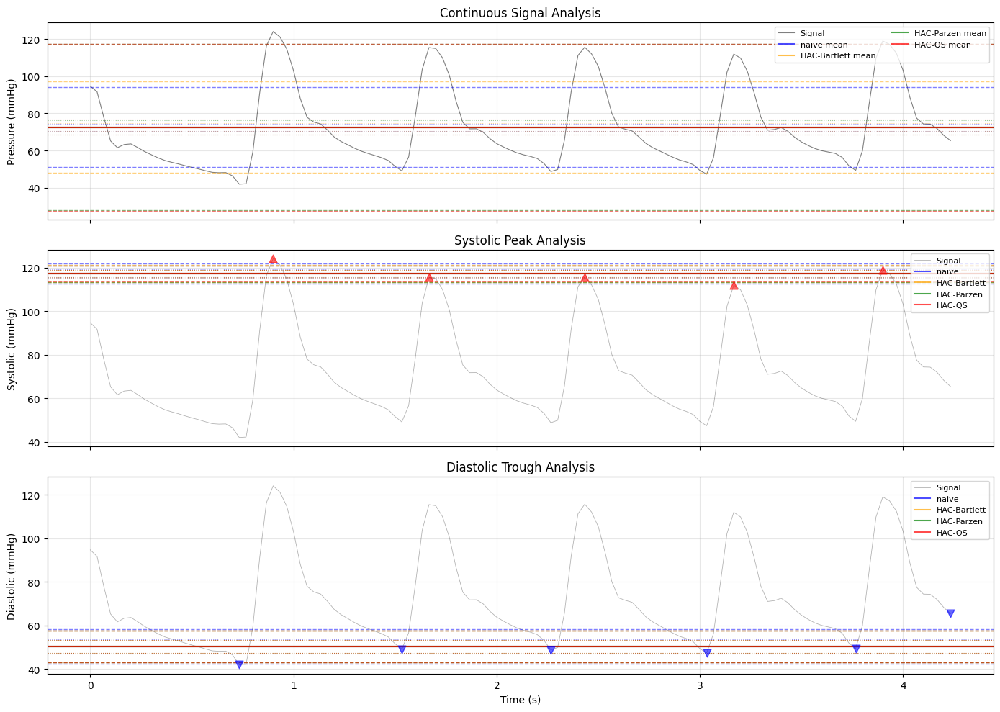

In [17]:
fs = 30
signal = df['label'].values[0]
sig_max_ids, sig_max_vals = find_peaks(trace=signal, type='max', width=int(fs//2),clip_ends=True)
sig_min_ids, sig_min_vals = find_peaks(trace=signal, type='min', width=int(fs//2),clip_ends=False)
visualize_estimators(signal=signal,
                    sig_max_ids=sig_max_ids,
                    sig_max_vals=sig_max_vals,
                    sig_min_ids=sig_min_ids,
                    sig_min_vals=sig_min_vals,
                    fs=fs,
                    figsize=(14,10))